In [1]:
# To load and work with image
from PIL import Image
# For numerical operations
import numpy as np
# To plot data
import matplotlib.pyplot as plt
# To visualize data
import pandas as pd
# To import clustering algorithms
from sklearn.cluster import KMeans
# To work with web colors
import webcolors
# To determine image sizes
import os

In [2]:
# To calculate Euclidean distance between two points
def distance(p1, p2):
    return np.sqrt(np.sum((p1 - p2) ** 2))

In [3]:
# To calculate Within Cluster Sum of Square (WCSS)
def WCSS_Score(cluster_centers, labels, data):
    wcss = 0
    for index, cluster_center in enumerate(cluster_centers):
        current_data = data[labels == index]
        distances_from_center = np.sum((current_data - cluster_center) ** 2)
        wcss += distances_from_center
    return wcss

In [4]:
# To calculate Between Cluster Sum of Square (BCSS)
def BCSS_Score(cluster_centers, labels, data):
    overall = data.mean(axis=0)
    bcss = 0
    for index, cluster_center in enumerate(cluster_centers):
        cluster_size = (labels == index).sum()
        bcss += cluster_size * ((cluster_center - overall) ** 2).sum()
    return bcss

In [5]:
# To calculate Explained Variance Score
def explained_variance_score(WCSS, BCSS):
    if WCSS + BCSS == 0:  
        return 0
    else:
        return BCSS / (WCSS + BCSS)

In [6]:
# To find the closest color name for a given RGB value
def closest_color(center_color):
    min_colors = {}
    for key, name in webcolors.CSS3_HEX_TO_NAMES.items():
        r_c, g_c, b_c = webcolors.hex_to_rgb(key)
        rd = (r_c - center_color[0]) ** 2
        gd = (g_c - center_color[1]) ** 2
        bd = (b_c - center_color[2]) ** 2
        min_colors[(rd + gd + bd)] = name
    return min_colors[min(min_colors.keys())]

In [7]:
def get_color_names(cluster_centers):
    centers = cluster_centers.astype(int)
    color_names = [closest_color(center) for center in centers]
    return '; '.join(color_names)

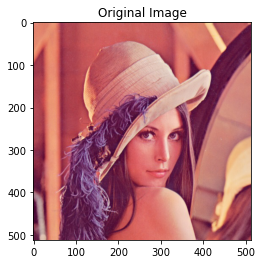

In [8]:
# To load and display the original image
image_1 = "lenna.JPEG"
image_lenna = Image.open(image_1)
plt.imshow(image_lenna)
plt.title("Original Image")
plt.show()

In [9]:
# To calculate the size of the image data
original_image_size = os.path.getsize('lenna.JPEG') 
print(f"Image Size: {original_image_size} bytes")

Image Size: 99488 bytes


In [10]:
# To calculate the number of unique colors in the image
img_lenna_original_array = np.array(image_lenna)
num_unique_color_lenna_original = np.unique(img_lenna_original_array.reshape(-1, 3), axis=0).shape[0]
print(f"Unique colors of the original image: {num_unique_color_lenna_original}")

Unique colors of the original image: 69147


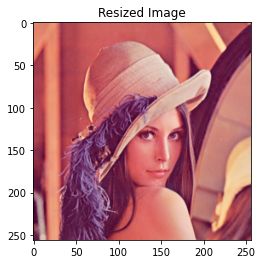

In [11]:
# To resize and display the image
img_lenna_resized = image_lenna.resize((256, 256))
plt.imshow(img_lenna_resized)
plt.title("Resized Image")
plt.show()

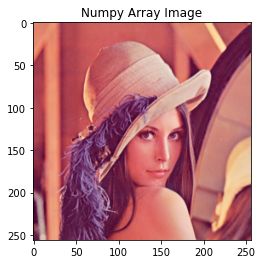

In [12]:
# To convert the image to numpy array and display the image
img_lenna_array = np.array(img_lenna_resized)
N, M, _ = img_lenna_array.shape
plt.imshow(img_lenna_array)
plt.title("Numpy Array Image")
plt.show()

In [13]:
# To reshape the data
img_lenna_reshaped = img_lenna_array.reshape(-1, 3)

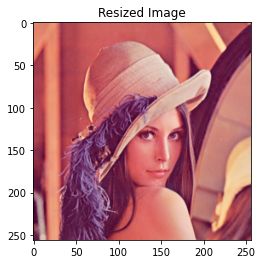

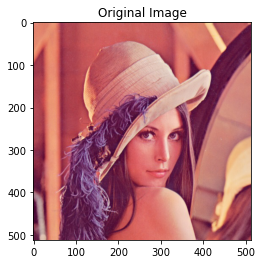

In [14]:
# To compare the resized image and original image
plt.imshow(img_lenna_resized)
plt.title("Resized Image")
plt.show()
plt.imshow(image_lenna)
plt.title("Original Image")
plt.show()

In [15]:
# To calculate the size of the compressed image data
img_lenna_resized.save('lenna_resized.JPEG')
img_lenna_compressed_size = os.path.getsize('lenna_resized.JPEG') 
print(f"Compressed Image Size: {img_lenna_compressed_size} bytes")

Compressed Image Size: 12108 bytes


In [16]:
# To calculate the number of unique colors in the compressed image
num_unique_color_lenna = np.unique(img_lenna_array.reshape(-1, 3), axis=0).shape[0]
print(f"Unique colors of compressed image: {num_unique_color_lenna}")

Unique colors of compressed image: 46166


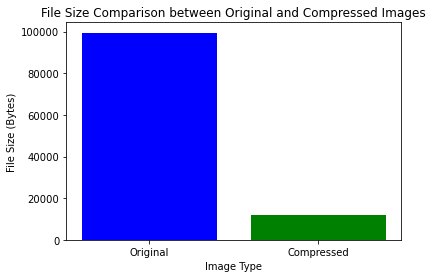

In [17]:
# To compare the original image and compressed image according to size
categories_sizes = ['Original', 'Compressed']
sizes = [original_image_size, img_lenna_compressed_size]

plt.figure(figsize=(6, 4))
plt.bar(categories_sizes, sizes, color=['blue', 'green'])
plt.xlabel('Image Type')
plt.ylabel('File Size (Bytes)')
plt.title('File Size Comparison between Original and Compressed Images')
plt.show()

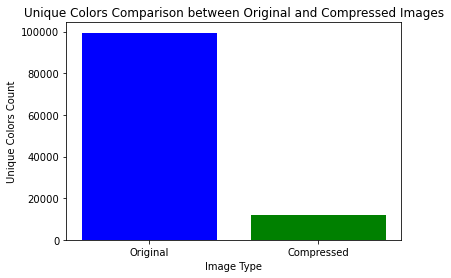

In [18]:
# To compare the original image and compressed image according to number of unique colors 
categories = ['Original', 'Compressed']
color_counts = [num_unique_color_lenna_original, num_unique_color_lenna]

plt.figure(figsize=(6, 4))
plt.bar(categories_sizes, sizes, color=['blue', 'green'])
plt.xlabel('Image Type')
plt.ylabel('Unique Colors Count')
plt.title('Unique Colors Comparison between Original and Compressed Images')
plt.show()

In [19]:
# To store numbers of clusters and various metrics for different numbers of clusters
num_clusters = []
color_names = []  
WCSS_scores = []
BCSS_scores = []
explained_variance = []
compressed_sizes = []
sse=[]

In [20]:
# To set the range of K values for numbers of clusters
K_values = [2**i for i in range(1,9)]

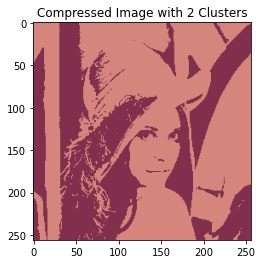

K = 2
Size = 11089 bytes
WCSS = 146623621.34687674, BCSS = 261337829.01517665, Explained Variance = 0.6405944208288485



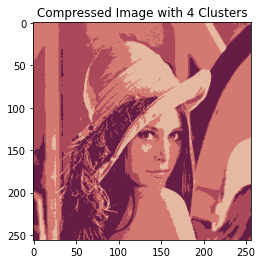

K = 4
Size = 13649 bytes
WCSS = 51094682.76306079, BCSS = 356588034.33613193, Explained Variance = 0.8746704713738723



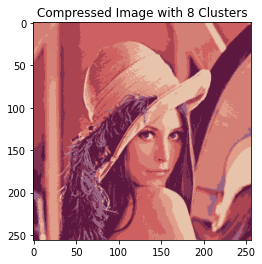

K = 8
Size = 13496 bytes
WCSS = 24455033.57635143, BCSS = 383564026.0117935, Explained Variance = 0.940063992106064



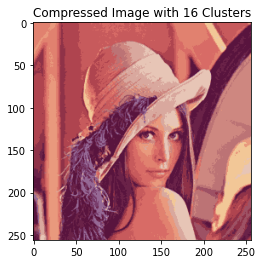

K = 16
Size = 13357 bytes
WCSS = 12261665.353574656, BCSS = 395571018.2677363, Explained Variance = 0.9699345691358074



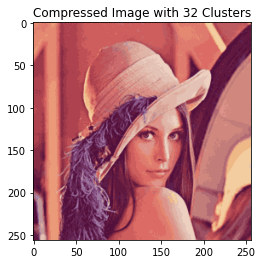

K = 32
Size = 12803 bytes
WCSS = 6511881.441317469, BCSS = 401289733.3493937, Explained Variance = 0.9840317418932747



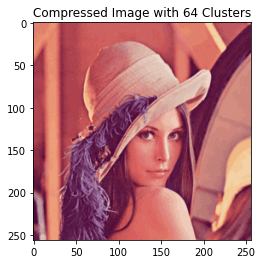

K = 64
Size = 12542 bytes
WCSS = 3811227.614405072, BCSS = 403895193.715082, Explained Variance = 0.990652029462825



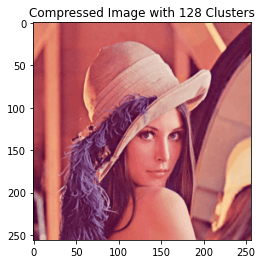

K = 128
Size = 12396 bytes
WCSS = 2361244.886338199, BCSS = 405345057.82708305, Explained Variance = 0.9942084660682866



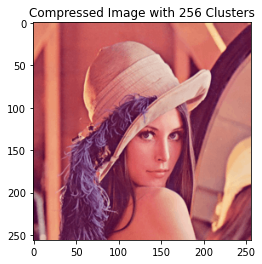

K = 256
Size = 12317 bytes
WCSS = 1485325.6226594273, BCSS = 406272489.8773342, Explained Variance = 0.9963573337746129



In [21]:
# To create loop to perform KMeans cluster for each K value 
for K in K_values:
    # To initialize the KMeans model
    model_lenna = KMeans(n_clusters=K)
    # To fit the model
    model_lenna.fit(img_lenna_reshaped)
    # To assign each pixel to the nearest cluster center
    clustered_img_lenna = model_lenna.cluster_centers_[model_lenna.labels_]
    # To reshape the clustered image to its original shape
    clustered_lenna = clustered_img_lenna.reshape(N, M, 3).astype(np.uint8)
    
    # Save the clustered image as a JPEG file
    clustered_image_filename = f'lenna_clustered_{K}.JPEG'
    Image.fromarray(clustered_lenna).save(clustered_image_filename)
    
    # To retrieve model attributes
    cluster_centers = model_lenna.cluster_centers_
    labels = model_lenna.labels_    
    
    # To calculate the total size of the compressed image
    total_size = os.path.getsize(clustered_image_filename)
       
    # To calculate metrics
    WCSS = WCSS_Score(cluster_centers, labels, img_lenna_reshaped)
    BCSS = BCSS_Score(cluster_centers, labels, img_lenna_reshaped)
    Explained_Variance = explained_variance_score(WCSS, BCSS)
    
    # To append results to lists
    num_clusters.append(K)
    color_names.append(get_color_names(cluster_centers))  
    WCSS_scores.append(WCSS)
    BCSS_scores.append(BCSS)
    explained_variance.append(Explained_Variance)
    compressed_sizes.append(total_size)
    sse.append(model_lenna.inertia_)
    
    # To plot and display each clustered image
    plt.imshow(clustered_lenna)
    plt.title(f"Compressed Image with {K} Clusters")
    plt.show()
    
    # To print the size and metrics
    print(f"K = {K}")
    print(f"Size = {total_size} bytes")
    print(f"WCSS = {WCSS}, BCSS = {BCSS}, Explained Variance = {Explained_Variance}\n")

In [22]:
# To create a DataFrame to summarize the results
results_df = pd.DataFrame({
    'Image Name': 'Lenna',
    'Number of Clusters' : num_clusters,
    'WCSS': WCSS_scores,
    'BCSS': BCSS_scores,
    'Explained Variance': explained_variance,
    'Compressed Image Size': compressed_sizes,
    'Color Names': color_names
})

print(results_df)

  Image Name  Number of Clusters          WCSS          BCSS  \
0      Lenna                   2  1.466236e+08  2.613378e+08   
1      Lenna                   4  5.109468e+07  3.565880e+08   
2      Lenna                   8  2.445503e+07  3.835640e+08   
3      Lenna                  16  1.226167e+07  3.955710e+08   
4      Lenna                  32  6.511881e+06  4.012897e+08   
5      Lenna                  64  3.811228e+06  4.038952e+08   
6      Lenna                 128  2.361245e+06  4.053451e+08   
7      Lenna                 256  1.485326e+06  4.062725e+08   

   Explained Variance  Compressed Image Size  \
0            0.640594                  11089   
1            0.874670                  13649   
2            0.940064                  13496   
3            0.969935                  13357   
4            0.984032                  12803   
5            0.990652                  12542   
6            0.994208                  12396   
7            0.996357                  

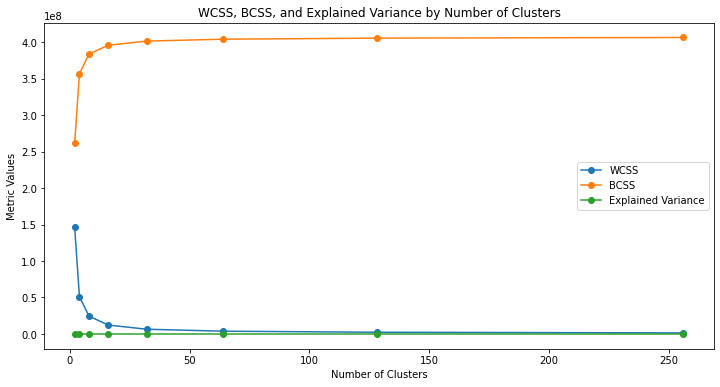

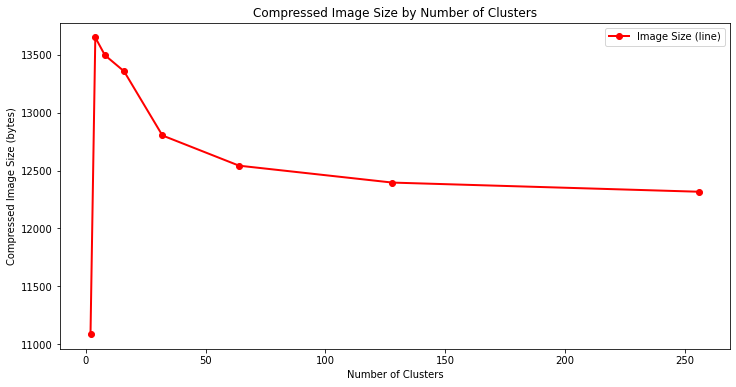

In [23]:
# Line Graphs for WCSS, BCSS, and Explained Variance
plt.figure(figsize=(12, 6))
plt.plot(results_df['Number of Clusters'], results_df['WCSS'], marker='o', label='WCSS')
plt.plot(results_df['Number of Clusters'], results_df['BCSS'], marker='o', label='BCSS')
plt.plot(results_df['Number of Clusters'], results_df['Explained Variance'], marker='o', label='Explained Variance')
plt.xlabel('Number of Clusters')
plt.ylabel('Metric Values')
plt.title('WCSS, BCSS, and Explained Variance by Number of Clusters')
plt.legend()
plt.show()


plt.figure(figsize=(12, 6))
plt.plot(results_df['Number of Clusters'], results_df['Compressed Image Size'], color='red', marker='o', linestyle='-', linewidth=2, label='Image Size (line)')
plt.xlabel('Number of Clusters')
plt.ylabel('Compressed Image Size (bytes)')
plt.title('Compressed Image Size by Number of Clusters')
plt.legend()
plt.show()

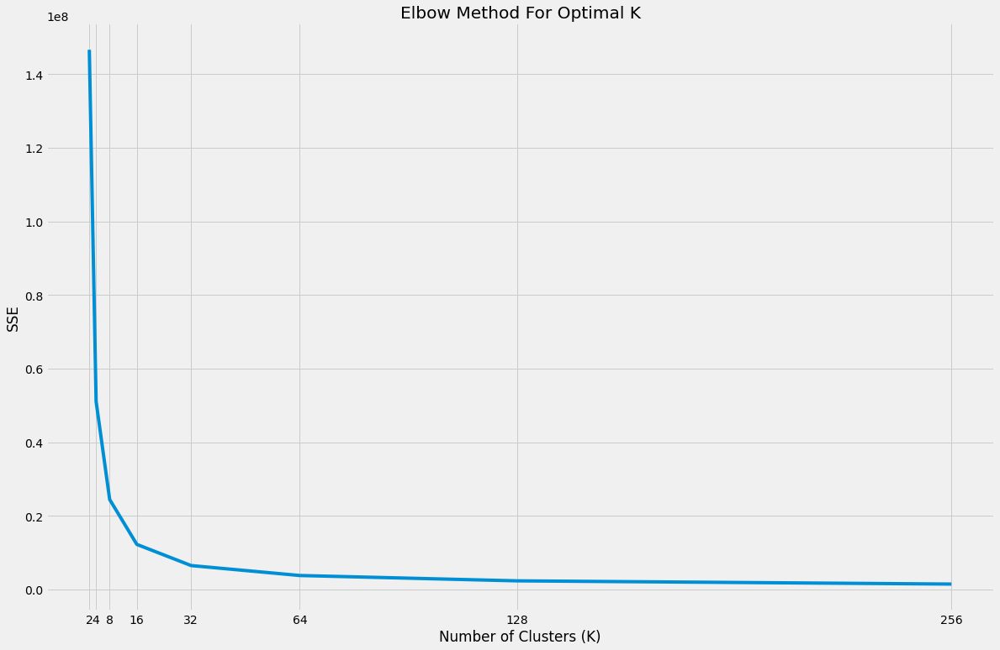

In [24]:
# To create a plot for the Elbow Method
plt.style.use("fivethirtyeight")
plt.figure(figsize=(18, 12))
plt.plot(num_clusters, sse) 
plt.xticks(num_clusters) 
plt.xlabel("Number of Clusters (K)")
plt.ylabel("SSE")
plt.title("Elbow Method For Optimal K")
plt.show()

In [25]:
# To determine the best number of clusters
K_optimal = 16  

# To compare the original and best compressed image 
best_compressed_metrics = results_df[results_df['Number of Clusters'] == K_optimal].iloc[0]
best_compressed_size = best_compressed_metrics['Compressed Image Size']
best_compressed_explained_variance = best_compressed_metrics['Explained Variance']

original_explained_variance = 1.0  

print(f"Original Image Size: {original_image_size} bytes")
print(f"Best Compressed Image Size: {best_compressed_size} bytes")

print(f"Original Image Explained Variance: {original_explained_variance}")
print(f"Best Compressed Image Explained Variance: {best_compressed_explained_variance}")

Original Image Size: 99488 bytes
Best Compressed Image Size: 13357 bytes
Original Image Explained Variance: 1.0
Best Compressed Image Explained Variance: 0.9699345691358074


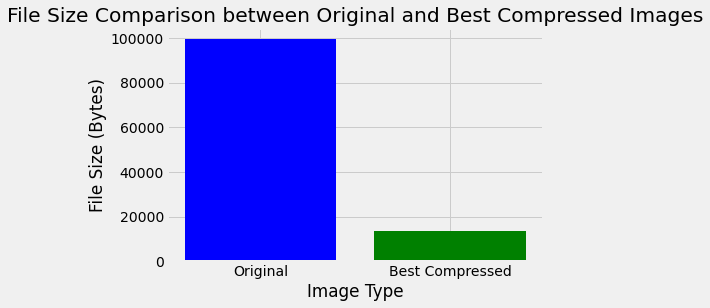

In [26]:
# To compare the original image and best compressed image according to size
categories_sizes = ['Original', 'Best Compressed']
sizes = [original_image_size, best_compressed_size]

plt.figure(figsize=(6, 4))
plt.bar(categories_sizes, sizes, color=['blue', 'green'])
plt.xlabel('Image Type')
plt.ylabel('File Size (Bytes)')
plt.title('File Size Comparison between Original and Best Compressed Images')
plt.show()

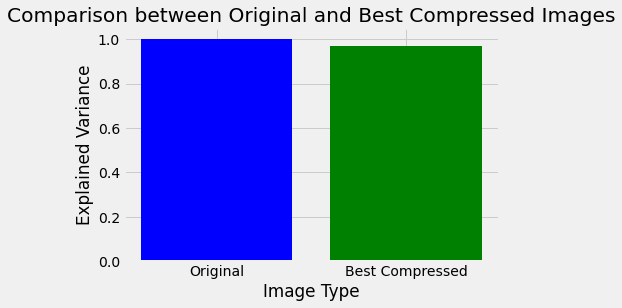

In [27]:
# To compare the original image and best compressed image according to explainded variance
categories_sizes = ['Original', 'Best Compressed']
sizes = [original_explained_variance, best_compressed_explained_variance]

plt.figure(figsize=(6, 4))
plt.bar(categories_sizes, sizes, color=['blue', 'green'])
plt.xlabel('Image Type')
plt.ylabel('Explained Variance')
plt.title('Comparison between Original and Best Compressed Images')
plt.show()

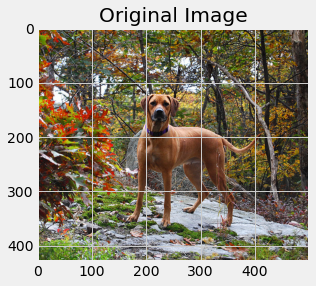

In [28]:
# To load and display the original image
image_2 = "dog.JPEG"
image_dog = Image.open(image_2)
plt.imshow(image_dog)
plt.title("Original Image")
plt.show()

In [29]:
# To calculate the size of the image data
original_image_size_d = os.path.getsize('dog.JPEG') 
print(f"Image Size: {original_image_size_d} bytes")

Image Size: 314619 bytes


In [30]:
# To calculate the number of unique colors in the image
img_dog_original_array = np.array(image_dog)
num_unique_color_dog_original = np.unique(img_dog_original_array.reshape(-1, 3), axis=0).shape[0]
print(f"Unique colors of the original image: {num_unique_color_dog_original}")

Unique colors of the original image: 135436


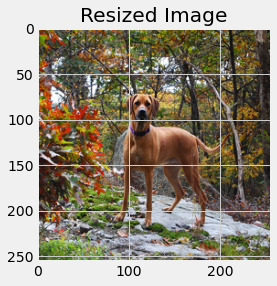

In [31]:
# To resize and display the image
img_dog_resized = image_dog.resize((256, 256))
plt.imshow(img_dog_resized)
plt.title("Resized Image")
plt.show()

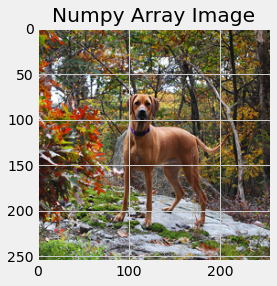

In [32]:
# To convert the image to numpy array and display the image
img_dog_array = np.array(img_dog_resized)
N, M, _ = img_dog_array.shape
plt.imshow(img_dog_array)
plt.title("Numpy Array Image")
plt.show()

In [33]:
# To reshape the data
img_dog_reshaped = img_dog_array.reshape(-1, 3)

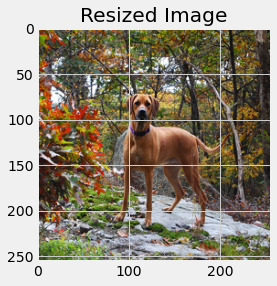

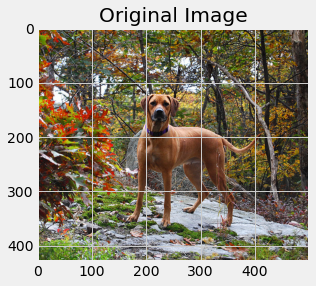

In [34]:
# To compare the resized image and original image
plt.imshow(img_dog_resized)
plt.title("Resized Image")
plt.show()
plt.imshow(image_dog)
plt.title("Original Image")
plt.show()

In [35]:
# To calculate the size of the compressed image data
img_dog_resized.save('dog_resized.JPEG')
img_dog_compressed_size = os.path.getsize('dog_resized.JPEG') 
print(f"Compressed Image Size: {img_dog_compressed_size} bytes")

Compressed Image Size: 25582 bytes


In [36]:
# To calculate the number of unique colors in the image
num_unique_color_dog = np.unique(img_dog_array.reshape(-1, 3), axis=0).shape[0]
print(f"Unique colors of compressed image: {num_unique_color_dog}")

Unique colors of compressed image: 59796


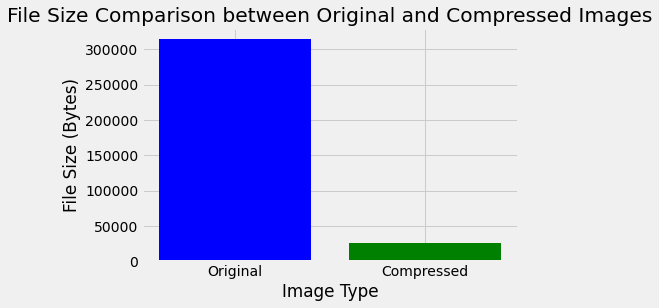

In [37]:
# To compare the original image and compressed image according to size
categories_sizes = ['Original', 'Compressed']
sizes = [original_image_size_d, img_dog_compressed_size]

plt.figure(figsize=(6, 4))
plt.bar(categories_sizes, sizes, color=['blue', 'green'])
plt.xlabel('Image Type')
plt.ylabel('File Size (Bytes)')
plt.title('File Size Comparison between Original and Compressed Images')
plt.show()

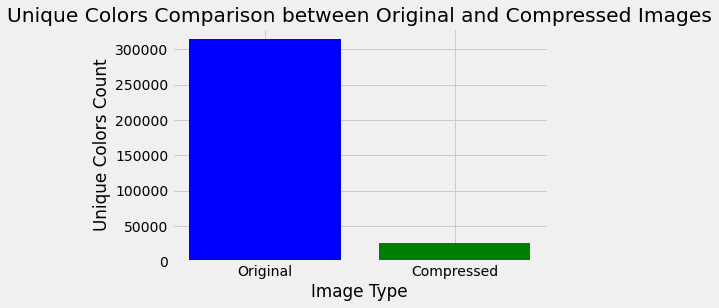

In [38]:
# To compare the original image and compressed image according to number of unique colors 
categories = ['Original', 'Compressed']
color_counts = [num_unique_color_dog_original, num_unique_color_dog]

plt.figure(figsize=(6, 4))
plt.bar(categories_sizes, sizes, color=['blue', 'green'])
plt.xlabel('Image Type')
plt.ylabel('Unique Colors Count')
plt.title('Unique Colors Comparison between Original and Compressed Images')
plt.show()

In [39]:
# To store numbers of clusters and various metrics for different numbers of clusters
num_clusters_d = []
color_names_d = []  
WCSS_scores_d = []
BCSS_scores_d = []
explained_variance_d = []
compressed_sizes_d = []
sse_d=[]

In [40]:
# To set the range of K values for numbers of clusters
K_values = [2**i for i in range(1,9)]

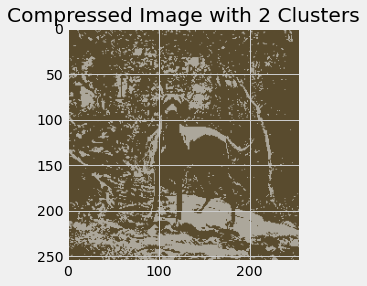

Size of the image with 2 clusters: 21290 bytes
K = 2: WCSS = 227653961.6091441, BCSS = 332212415.03058684, Explained Variance = 0.5933780432118405



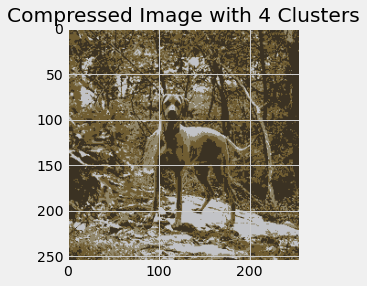

Size of the image with 4 clusters: 24605 bytes
K = 4: WCSS = 109210996.61648324, BCSS = 449631990.6201842, Explained Variance = 0.8045766000276695



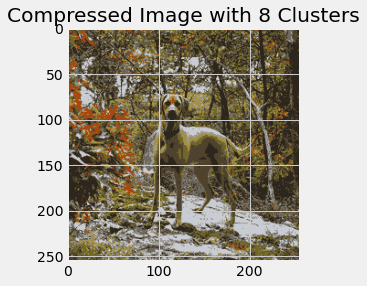

Size of the image with 8 clusters: 25664 bytes
K = 8: WCSS = 62069505.43734521, BCSS = 498151926.8335609, Explained Variance = 0.8892054072516629



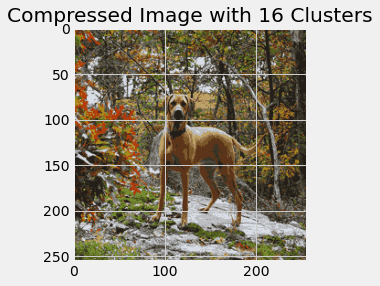

Size of the image with 16 clusters: 25760 bytes
K = 16: WCSS = 34791014.6710279, BCSS = 524589018.3901224, Explained Variance = 0.9378043322700712



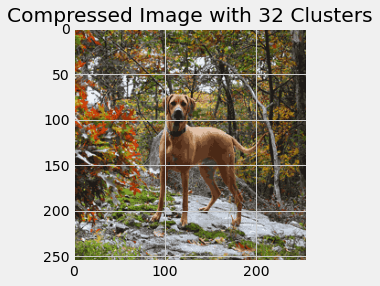

Size of the image with 32 clusters: 25660 bytes
K = 32: WCSS = 20349965.24592766, BCSS = 539695820.8974798, Explained Variance = 0.9636637472338435



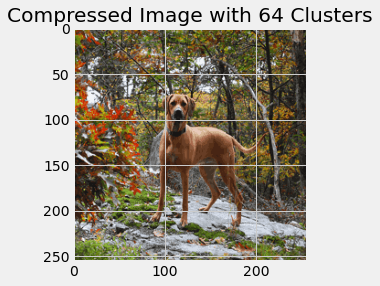

Size of the image with 64 clusters: 25620 bytes
K = 64: WCSS = 12383854.713901509, BCSS = 547659789.7676929, Explained Variance = 0.9778876970823146



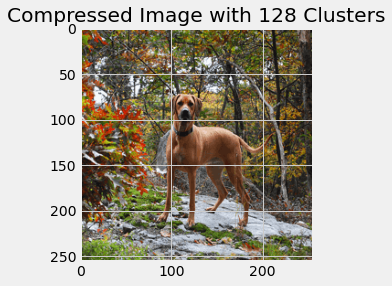

Size of the image with 128 clusters: 25588 bytes
K = 128: WCSS = 7752943.238509739, BCSS = 552246201.573488, Explained Variance = 0.9861554373603327



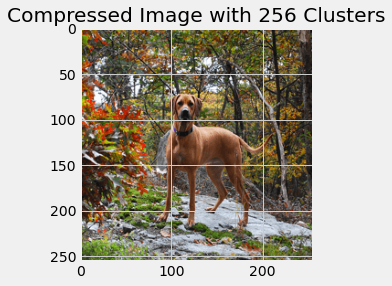

Size of the image with 256 clusters: 25595 bytes
K = 256: WCSS = 4854462.448693505, BCSS = 555119220.5506779, Explained Variance = 0.9913309096550901



In [41]:
# To create loop to perform KMeans cluster for each K value 
for K_d in K_values:
    # To initialize the KMeans model
    model_dog = KMeans(n_clusters=K_d)
    # To fit the model
    model_dog.fit(img_dog_reshaped)
    # To assign each pixel to the nearest cluster center
    clustered_img_dog = model_dog.cluster_centers_[model_dog.labels_]
    # To reshape the clustered image to its original shap
    clustered_dog = clustered_img_dog.reshape(N, M, 3).astype(np.uint8)
    
    # Save the clustered image as a JPEG file
    clustered_image_filename_d = f'dog_clustered_{K_d}.JPEG'
    Image.fromarray(clustered_dog).save(clustered_image_filename_d)
    
    # To retrieve model attributes
    cluster_centers_d = model_dog.cluster_centers_
    labels_d = model_dog.labels_  
    
    # To calculate the total size of the compressed image
    total_size_d = os.path.getsize(clustered_image_filename_d)
       
    # To calculate metrics
    WCSS_d = WCSS_Score(cluster_centers_d, labels_d, img_dog_reshaped)
    BCSS_d = BCSS_Score(cluster_centers_d, labels_d, img_dog_reshaped)
    Explained_Variance_d = explained_variance_score(WCSS_d, BCSS_d)
    
    # To append results to lists
    num_clusters_d.append(K_d)
    color_names_d.append(get_color_names(cluster_centers_d))  
    WCSS_scores_d.append(WCSS_d)
    BCSS_scores_d.append(BCSS_d)
    explained_variance_d.append(Explained_Variance_d)
    compressed_sizes_d.append(total_size_d)
    sse_d.append(model_dog.inertia_)
    
    # To plot and display each clustered image
    plt.imshow(clustered_dog)
    plt.title(f"Compressed Image with {K_d} Clusters")
    plt.show()
    
    # To print the size and metrics
    print(f"Size of the image with {K_d} clusters: {total_size_d} bytes")
    print(f"K = {K_d}: WCSS = {WCSS_d}, BCSS = {BCSS_d}, Explained Variance = {Explained_Variance_d}\n")

In [42]:
# To create a DataFrame to summarize the results
results_df = pd.DataFrame({
    'Image Name': 'Dog',
    'Number of Clusters' : num_clusters_d,
    'WCSS': WCSS_scores_d,
    'BCSS': BCSS_scores_d,
    'Explained Variance': explained_variance_d,
    'Compressed Image Size': compressed_sizes_d,
    'Color Names': color_names_d
});

print(results_df)

  Image Name  Number of Clusters          WCSS          BCSS  \
0        Dog                   2  2.276540e+08  3.322124e+08   
1        Dog                   4  1.092110e+08  4.496320e+08   
2        Dog                   8  6.206951e+07  4.981519e+08   
3        Dog                  16  3.479101e+07  5.245890e+08   
4        Dog                  32  2.034997e+07  5.396958e+08   
5        Dog                  64  1.238385e+07  5.476598e+08   
6        Dog                 128  7.752943e+06  5.522462e+08   
7        Dog                 256  4.854462e+06  5.551192e+08   

   Explained Variance  Compressed Image Size  \
0            0.593378                  21290   
1            0.804577                  24605   
2            0.889205                  25664   
3            0.937804                  25760   
4            0.963664                  25660   
5            0.977888                  25620   
6            0.986155                  25588   
7            0.991331                  

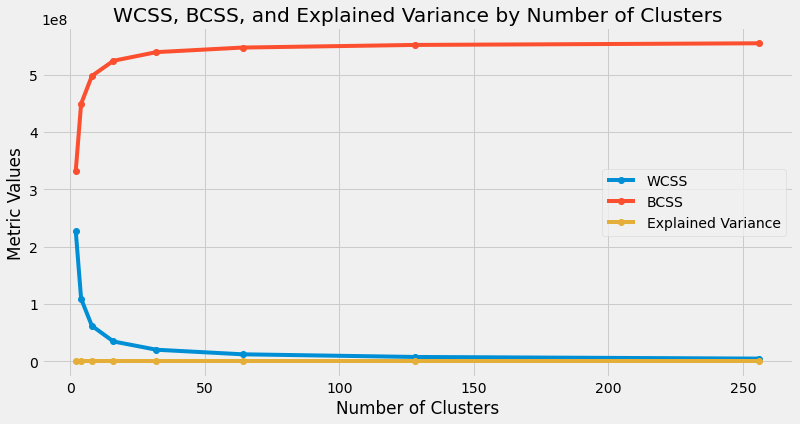

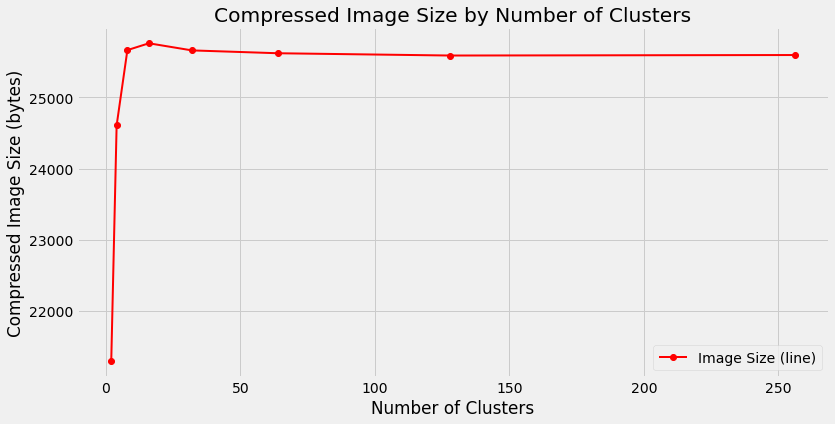

In [43]:
# Line Graphs for WCSS, BCSS, and Explained Variance
plt.figure(figsize=(12, 6))
plt.plot(results_df['Number of Clusters'], results_df['WCSS'], marker='o', label='WCSS')
plt.plot(results_df['Number of Clusters'], results_df['BCSS'], marker='o', label='BCSS')
plt.plot(results_df['Number of Clusters'], results_df['Explained Variance'], marker='o', label='Explained Variance')
plt.xlabel('Number of Clusters')
plt.ylabel('Metric Values')
plt.title('WCSS, BCSS, and Explained Variance by Number of Clusters')
plt.legend()
plt.show()


plt.figure(figsize=(12, 6))
plt.plot(results_df['Number of Clusters'], results_df['Compressed Image Size'], color='red', marker='o', linestyle='-', linewidth=2, label='Image Size (line)')
plt.xlabel('Number of Clusters')
plt.ylabel('Compressed Image Size (bytes)')
plt.title('Compressed Image Size by Number of Clusters')
plt.legend()
plt.show()

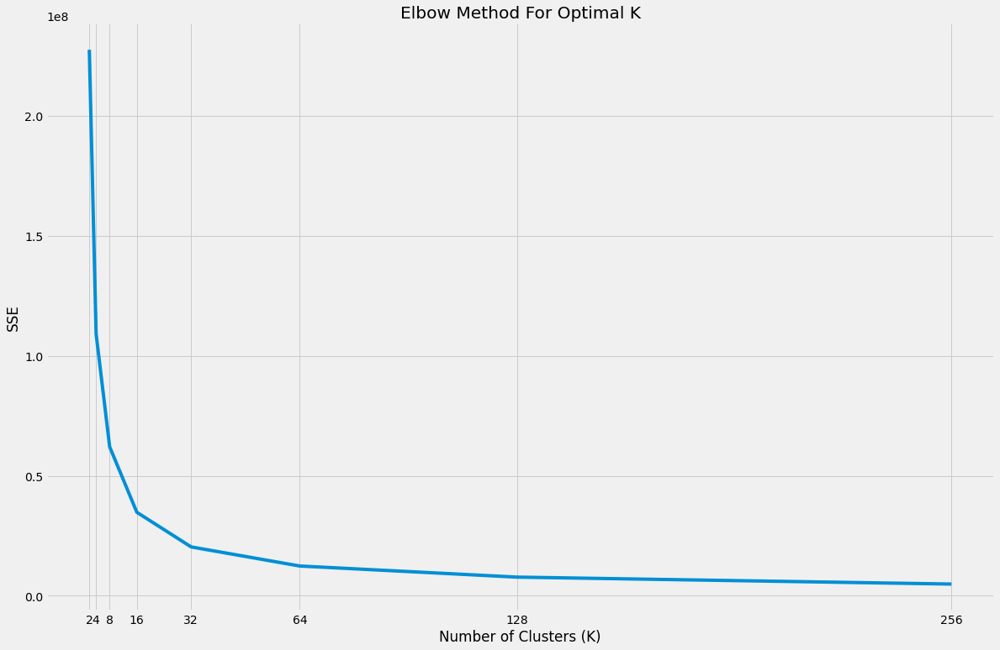

In [44]:
# To create a plot for the Elbow Method
plt.style.use("fivethirtyeight")
plt.figure(figsize=(18, 12))
plt.plot(num_clusters_d, sse_d) 
plt.xticks(num_clusters_d) 
plt.xlabel("Number of Clusters (K)")
plt.ylabel("SSE")
plt.title("Elbow Method For Optimal K")
plt.show()

In [45]:
# To determine the best number of clusters
K_optimal_d = 16  

# To compare the original and best compressed image 
best_compressed_metrics_d = results_df[results_df['Number of Clusters'] == K_optimal_d].iloc[0]
best_compressed_size_d = best_compressed_metrics_d['Compressed Image Size']
best_compressed_explained_variance_d = best_compressed_metrics_d['Explained Variance']
 
original_explained_variance = 1.0  

print(f"Original Image Size: {original_image_size_d} bytes")
print(f"Best Compressed Image Size: {best_compressed_size_d} bytes")

print(f"Original Image Explained Variance: {original_explained_variance}")
print(f"Best Compressed Image Explained Variance: {best_compressed_explained_variance_d}")

Original Image Size: 314619 bytes
Best Compressed Image Size: 25760 bytes
Original Image Explained Variance: 1.0
Best Compressed Image Explained Variance: 0.9378043322700712


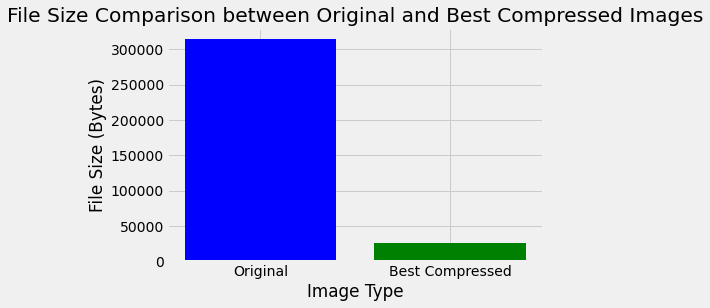

In [46]:
# To compare the original image and best compressed image according to size
categories_sizes = ['Original', 'Best Compressed']
sizes = [original_image_size_d, best_compressed_size_d]

plt.figure(figsize=(6, 4))
plt.bar(categories_sizes, sizes, color=['blue', 'green'])
plt.xlabel('Image Type')
plt.ylabel('File Size (Bytes)')
plt.title('File Size Comparison between Original and Best Compressed Images')
plt.show()

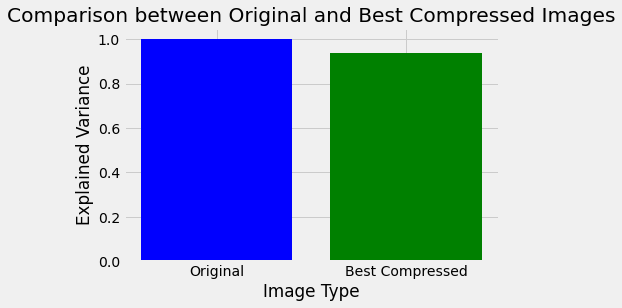

In [47]:
# To compare the original image and best compressed image according to explainded variance
categories_sizes = ['Original', 'Best Compressed']
sizes = [original_explained_variance, best_compressed_explained_variance_d]

plt.figure(figsize=(6, 4))
plt.bar(categories_sizes, sizes, color=['blue', 'green'])
plt.xlabel('Image Type')
plt.ylabel('Explained Variance')
plt.title('Comparison between Original and Best Compressed Images')
plt.show()

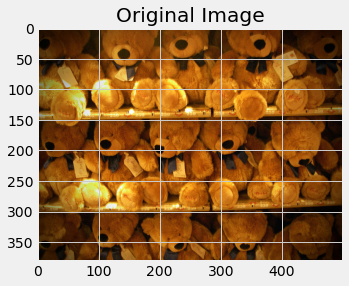

In [48]:
# To load and display the original image
image_3 = "bears.JPEG"
image_bears = Image.open(image_3)
plt.imshow(image_bears)
plt.title("Original Image")
plt.show()

In [49]:
# To calculate the size of the image data
original_image_size_b = os.path.getsize('bears.JPEG') 
print(f"Image Size: {original_image_size_b} bytes")

Image Size: 176732 bytes


In [50]:
# To calculate the number of unique colors in the image
img_bears_original_array = np.array(image_bears)
num_unique_color_bears_original = np.unique(img_bears_original_array.reshape(-1, 3), axis=0).shape[0]
print(f"Unique colors of the original image: {num_unique_color_bears_original}")

Unique colors of the original image: 52971


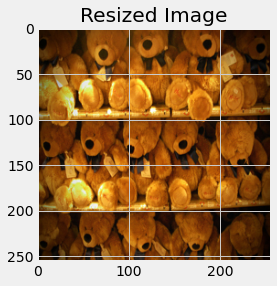

In [51]:
# To resize and display the image
img_bears_resized = image_bears.resize((256, 256))
plt.imshow(img_bears_resized)
plt.title("Resized Image")
plt.show()

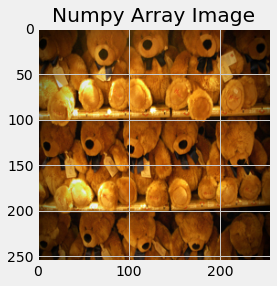

In [52]:
# To convert the image to numpy array and display the image
img_bears_array = np.array(img_bears_resized)
N, M, _ = img_bears_array.shape
plt.imshow(img_bears_array)
plt.title("Numpy Array Image")
plt.show()

In [53]:
# To reshape the data
img_bears_reshaped = img_bears_array.reshape(-1, 3)

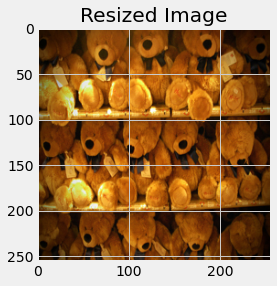

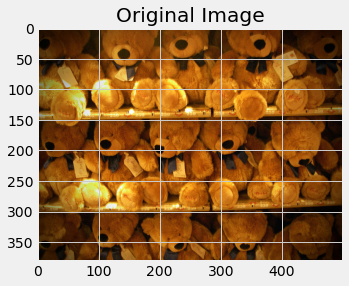

In [54]:
# To compare the resized image and original image
plt.imshow(img_bears_resized)
plt.title("Resized Image")
plt.show()
plt.imshow(image_bears)
plt.title("Original Image")
plt.show()

In [55]:
# To calculate the size of the compressed image data
img_bears_resized.save('bears_resized.JPEG')
img_bears_compressed_size = os.path.getsize('bears_resized.JPEG') 
print(f"Compressed Image Size: {img_bears_compressed_size} bytes")

Compressed Image Size: 15675 bytes


In [56]:
# To calculate the number of unique colors in the image
num_unique_color_bears = np.unique(img_bears_array.reshape(-1, 3), axis=0).shape[0]
print(f"Unique colors of compressed image: {num_unique_color_bears}")

Unique colors of compressed image: 39411


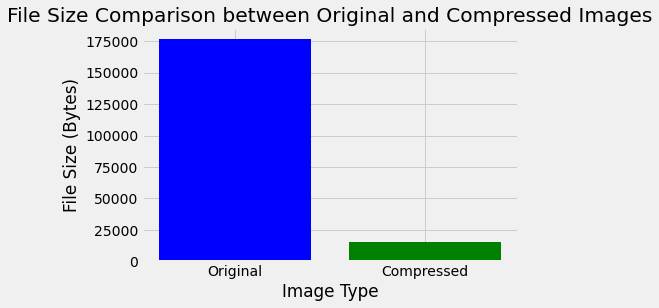

In [57]:
# To compare the original image and compressed image according to size
categories_sizes = ['Original', 'Compressed']
sizes = [original_image_size_b, img_bears_compressed_size]

plt.figure(figsize=(6, 4))
plt.bar(categories_sizes, sizes, color=['blue', 'green'])
plt.xlabel('Image Type')
plt.ylabel('File Size (Bytes)')
plt.title('File Size Comparison between Original and Compressed Images')
plt.show()

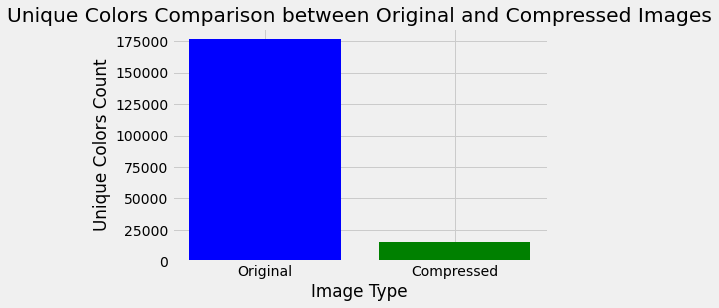

In [58]:
# To compare the original image and compressed image according to number of unique colors 
categories = ['Original', 'Compressed']
color_counts = [num_unique_color_bears_original, num_unique_color_bears]

plt.figure(figsize=(6, 4))
plt.bar(categories_sizes, sizes, color=['blue', 'green'])
plt.xlabel('Image Type')
plt.ylabel('Unique Colors Count')
plt.title('Unique Colors Comparison between Original and Compressed Images')
plt.show()

In [59]:
# To store numbers of clusters and various metrics for different numbers of clusters
num_clusters_b = []
color_names_b = []  
WCSS_scores_b = []
BCSS_scores_b = []
explained_variance_b = []
compressed_sizes_b = []
sse_b=[]

In [60]:
# To set the range of K values for numbers of clusters
K_values = [2**i for i in range(1,9)]

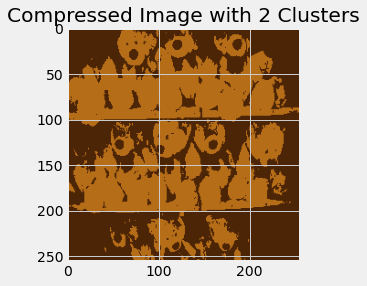

Size of the image with 2 clusters: 14510 bytes
K = 2: WCSS = 164335941.14057672, BCSS = 276402354.0590644, Explained Variance = 0.6271348713500434



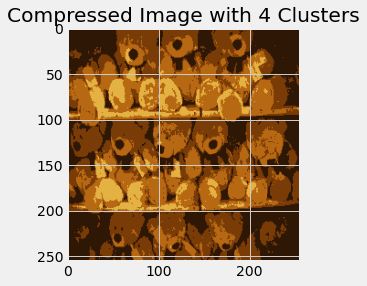

Size of the image with 4 clusters: 17722 bytes
K = 4: WCSS = 59450415.95887849, BCSS = 382172095.9836035, Explained Variance = 0.8653818264440707



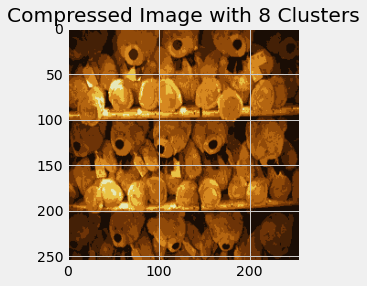

Size of the image with 8 clusters: 17320 bytes
K = 8: WCSS = 22946805.222261965, BCSS = 418536091.1338701, Explained Variance = 0.9480233426670477



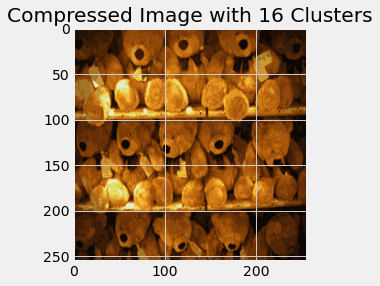

Size of the image with 16 clusters: 16299 bytes
K = 16: WCSS = 10768224.314293664, BCSS = 430125389.045904, Explained Variance = 0.975576365844301



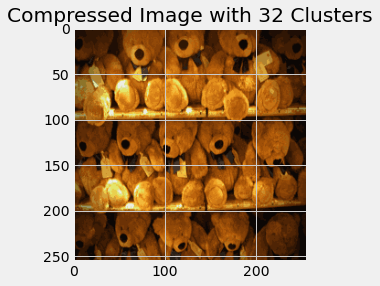

Size of the image with 32 clusters: 15873 bytes
K = 32: WCSS = 5837292.839274043, BCSS = 434442341.6223064, Explained Variance = 0.9867418513545091



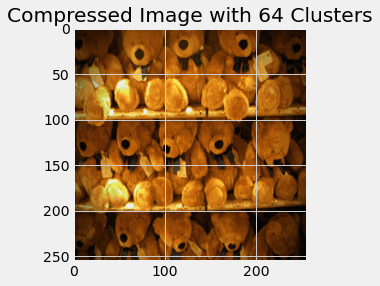

Size of the image with 64 clusters: 15887 bytes
K = 64: WCSS = 3290655.4318093075, BCSS = 437700581.06506944, Explained Variance = 0.9925380480166693



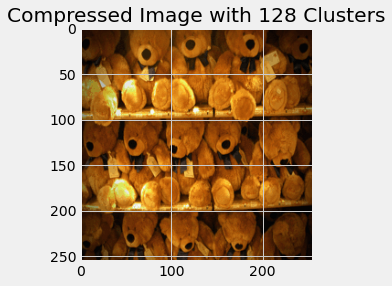

Size of the image with 128 clusters: 15749 bytes
K = 128: WCSS = 1963498.2414243575, BCSS = 438643255.0624455, Explained Variance = 0.9955436492366465



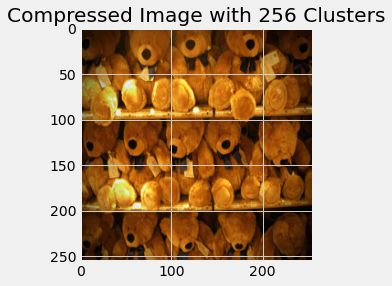

Size of the image with 256 clusters: 15712 bytes
K = 256: WCSS = 1208809.2587455406, BCSS = 439461497.22875625, Explained Variance = 0.9972568851566589



In [61]:
# To create loop to perform KMeans cluster for each K value 
for K_b in K_values:
    # To initialize the KMeans model
    model_bears = KMeans(n_clusters=K_b)
    # To fit the model
    model_bears.fit(img_bears_reshaped)
    # To assign each pixel to the nearest cluster center
    clustered_img_bears = model_bears.cluster_centers_[model_bears.labels_]
    # To reshape the clustered image to its original shap
    clustered_bears = clustered_img_bears.reshape(N, M, 3).astype(np.uint8)
    
    # Save the clustered image as a JPEG file
    clustered_image_filename_b = f'bears_clustered_{K_b}.JPEG'
    Image.fromarray(clustered_bears).save(clustered_image_filename_b)
    
    # To retrieve model attributes
    cluster_centers_b = model_bears.cluster_centers_
    labels_b = model_bears.labels_
    
    # To calculate the total size of the compressed image
    total_size_b =  os.path.getsize(clustered_image_filename_b) 
       
    # To calculate metrics
    WCSS_b = WCSS_Score(cluster_centers_b, labels_b, img_bears_reshaped)
    BCSS_b = BCSS_Score(cluster_centers_b, labels_b, img_bears_reshaped)
    Explained_Variance_b = explained_variance_score(WCSS_b, BCSS_b)
    
    # To append results to lists
    num_clusters_b.append(K_b)
    color_names_b.append(get_color_names(cluster_centers_b))  
    WCSS_scores_b.append(WCSS_b)
    BCSS_scores_b.append(BCSS_b)
    explained_variance_b.append(Explained_Variance_b)
    compressed_sizes_b.append(total_size_b)
    sse_b.append(model_bears.inertia_)
    
    # To plot and display each clustered image
    plt.imshow(clustered_bears)
    plt.title(f"Compressed Image with {K_b} Clusters")
    plt.show()
    
    # To print the size and metrics
    print(f"Size of the image with {K_b} clusters: {total_size_b} bytes")
    print(f"K = {K_b}: WCSS = {WCSS_b}, BCSS = {BCSS_b}, Explained Variance = {Explained_Variance_b}\n")

In [62]:
# To create a DataFrame to summarize the results
results_df = pd.DataFrame({
    'Image Name': 'Bears',
    'Number of Clusters' : num_clusters_b,
    'WCSS': WCSS_scores_b,
    'BCSS': BCSS_scores_b,
    'Explained Variance': explained_variance_b,
    'Compressed Image Size': compressed_sizes_b,
    'Color Names': color_names_b
})

print(results_df)

  Image Name  Number of Clusters          WCSS          BCSS  \
0      Bears                   2  1.643359e+08  2.764024e+08   
1      Bears                   4  5.945042e+07  3.821721e+08   
2      Bears                   8  2.294681e+07  4.185361e+08   
3      Bears                  16  1.076822e+07  4.301254e+08   
4      Bears                  32  5.837293e+06  4.344423e+08   
5      Bears                  64  3.290655e+06  4.377006e+08   
6      Bears                 128  1.963498e+06  4.386433e+08   
7      Bears                 256  1.208809e+06  4.394615e+08   

   Explained Variance  Compressed Image Size  \
0            0.627135                  14510   
1            0.865382                  17722   
2            0.948023                  17320   
3            0.975576                  16299   
4            0.986742                  15873   
5            0.992538                  15887   
6            0.995544                  15749   
7            0.997257                  

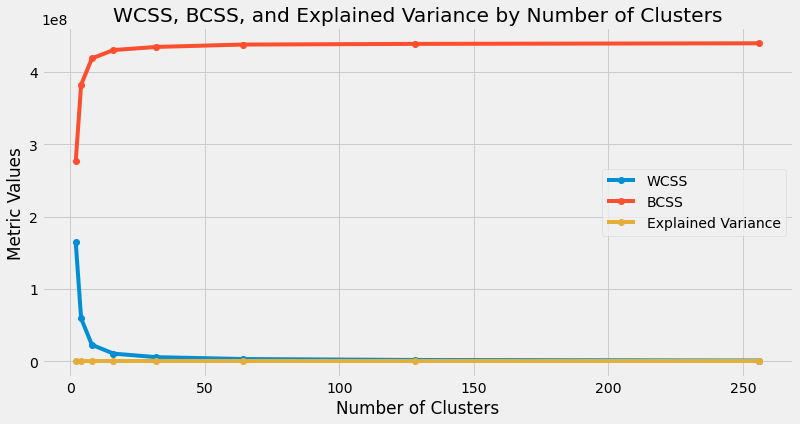

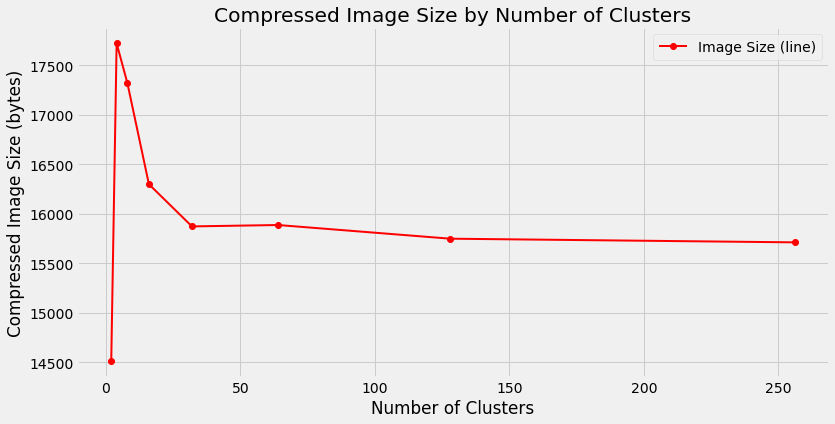

In [63]:
# Line Graphs for WCSS, BCSS, and Explained Variance
plt.figure(figsize=(12, 6))
plt.plot(results_df['Number of Clusters'], results_df['WCSS'], marker='o', label='WCSS')
plt.plot(results_df['Number of Clusters'], results_df['BCSS'], marker='o', label='BCSS')
plt.plot(results_df['Number of Clusters'], results_df['Explained Variance'], marker='o', label='Explained Variance')
plt.xlabel('Number of Clusters')
plt.ylabel('Metric Values')
plt.title('WCSS, BCSS, and Explained Variance by Number of Clusters')
plt.legend()
plt.show()


plt.figure(figsize=(12, 6))
plt.plot(results_df['Number of Clusters'], results_df['Compressed Image Size'], color='red', marker='o', linestyle='-', linewidth=2, label='Image Size (line)')
plt.xlabel('Number of Clusters')
plt.ylabel('Compressed Image Size (bytes)')
plt.title('Compressed Image Size by Number of Clusters')
plt.legend()
plt.show()

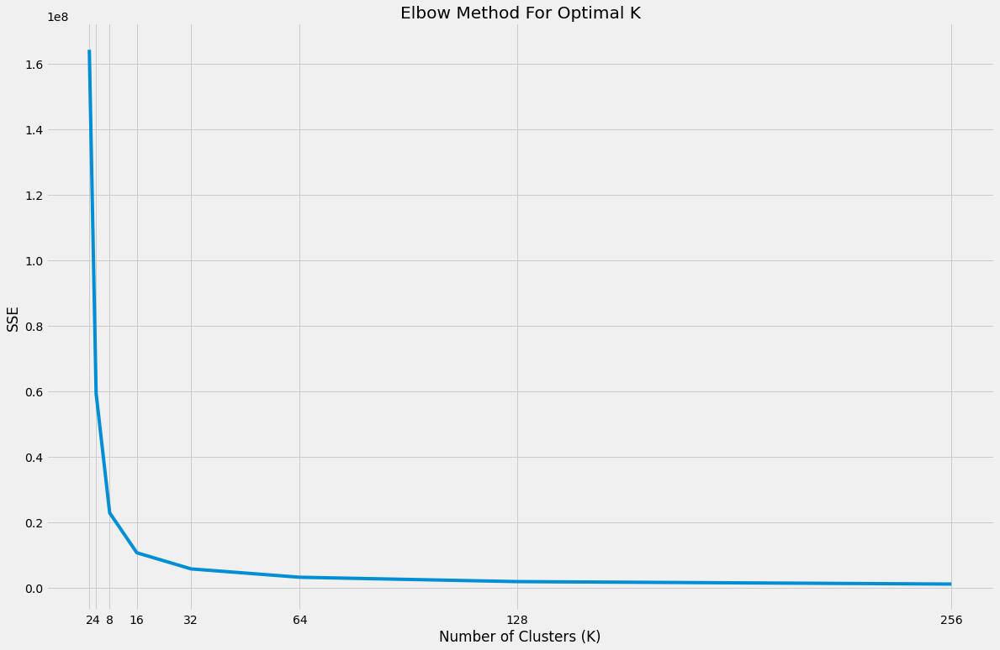

In [64]:
# To create a plot for the Elbow Method
plt.style.use("fivethirtyeight")
plt.figure(figsize=(18, 12))
plt.plot(num_clusters_b, sse_b) 
plt.xticks(num_clusters_b) 
plt.xlabel("Number of Clusters (K)")
plt.ylabel("SSE")
plt.title("Elbow Method For Optimal K")
plt.show()

In [65]:
# To determine the best number of clusters
K_optimal_b = 16  

# To compare the original and best compressed image 
best_compressed_metrics_b = results_df[results_df['Number of Clusters'] == K_optimal_b].iloc[0]
best_compressed_size_b = best_compressed_metrics_b['Compressed Image Size']
best_compressed_explained_variance_b = best_compressed_metrics_b['Explained Variance']

original_explained_variance = 1.0  

print(f"Original Image Size: {original_image_size_b} bytes")
print(f"Best Compressed Image Size: {best_compressed_size_b} bytes")

print(f"Original Image Explained Variance: {original_explained_variance}")
print(f"Best Compressed Image Explained Variance: {best_compressed_explained_variance_b}")

Original Image Size: 176732 bytes
Best Compressed Image Size: 16299 bytes
Original Image Explained Variance: 1.0
Best Compressed Image Explained Variance: 0.975576365844301


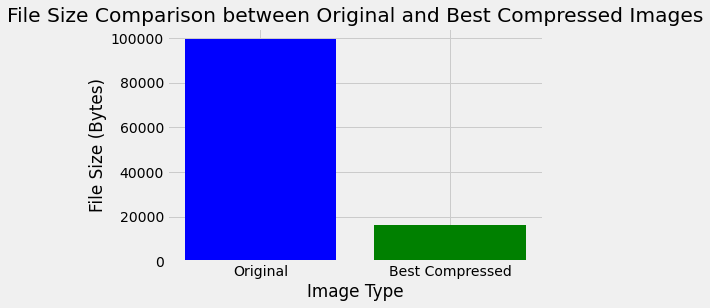

In [66]:
# To compare the original image and best compressed image according to size
categories_sizes = ['Original', 'Best Compressed']
sizes = [original_image_size, best_compressed_size_b]

plt.figure(figsize=(6, 4))
plt.bar(categories_sizes, sizes, color=['blue', 'green'])
plt.xlabel('Image Type')
plt.ylabel('File Size (Bytes)')
plt.title('File Size Comparison between Original and Best Compressed Images')
plt.show()

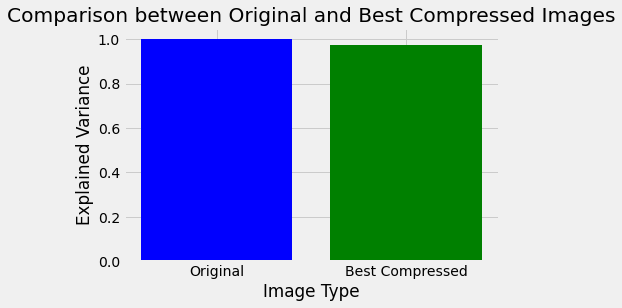

In [67]:
# To compare the original image and best compressed image according to explainded variance
categories_variance = ['Original', 'Best Compressed']
variance = [original_explained_variance, best_compressed_explained_variance_b]

plt.figure(figsize=(6, 4))
plt.bar(categories_variance, variance, color=['blue', 'green'])
plt.xlabel('Image Type')
plt.ylabel('Explained Variance')
plt.title('Comparison between Original and Best Compressed Images')
plt.show()

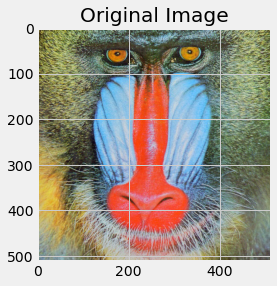

In [68]:
# To load and display the original image
image_4 = "baboon.JPEG"
image_baboon = Image.open(image_4)
plt.imshow(image_baboon)
plt.title("Original Image")
plt.show()

In [69]:
# To calculate the size of the image data
original_image_size_ba = os.path.getsize('baboon.JPEG') 
print(f"Image Size: {original_image_size_ba} bytes")

Image Size: 179841 bytes


In [70]:
# To calculate the number of unique colors in the image
img_baboon_original_array = np.array(image_baboon)
num_unique_color_baboon_original = np.unique(img_baboon_original_array.reshape(-1, 3), axis=0).shape[0]
print(f"Unique colors of the original image: {num_unique_color_baboon_original}")

Unique colors of the original image: 164898


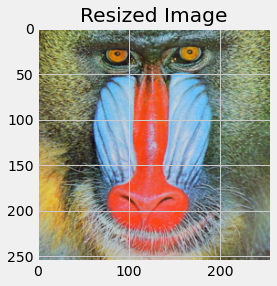

In [71]:
# To resize and display the image
img_baboon_resized = image_baboon.resize((256, 256))
plt.imshow(img_baboon_resized)
plt.title("Resized Image")
plt.show()

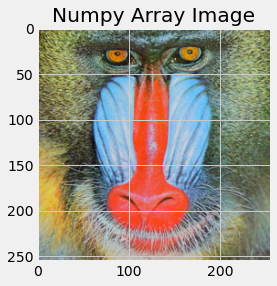

In [72]:
# To convert the image to numpy array and display the image
img_baboon_array = np.array(img_baboon_resized)
N, M, _ = img_baboon_array.shape
plt.imshow(img_baboon_array)
plt.title("Numpy Array Image")
plt.show()

In [73]:
# To reshape the data
img_baboon_reshaped = img_baboon_array.reshape(-1, 3)

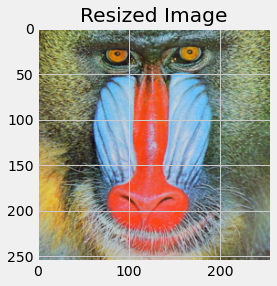

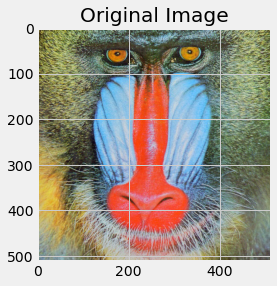

In [74]:
# To compare the resized image and original image
plt.imshow(img_baboon_resized)
plt.title("Resized Image")
plt.show()
plt.imshow(image_baboon)
plt.title("Original Image")
plt.show()

In [75]:
# To calculate the size of the compressed image data
img_baboon_resized.save('baboon_resized.JPEG')
img_baboon_compressed_size = os.path.getsize('baboon_resized.JPEG') 
print(f"Compressed Image Size: {img_baboon_compressed_size} bytes")

Compressed Image Size: 18751 bytes


In [76]:
num_unique_color_baboon = np.unique(img_baboon_array.reshape(-1, 3), axis=0).shape[0]
print(f"Unique colors of compressed image: {num_unique_color_baboon}")

Unique colors of compressed image: 62077


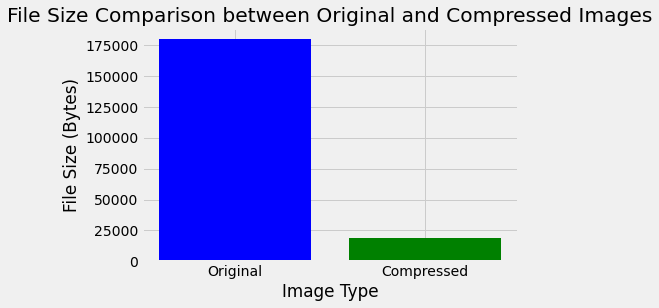

In [77]:
# To compare the original image and compressed image according to size
categories_sizes = ['Original', 'Compressed']
sizes = [original_image_size_ba, img_baboon_compressed_size]

plt.figure(figsize=(6, 4))
plt.bar(categories_sizes, sizes, color=['blue', 'green'])
plt.xlabel('Image Type')
plt.ylabel('File Size (Bytes)')
plt.title('File Size Comparison between Original and Compressed Images')
plt.show()

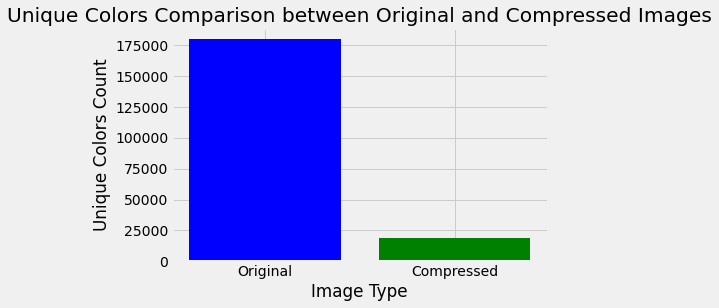

In [78]:
# To compare the original image and compressed image according to number of unique colors 
categories = ['Original', 'Compressed']
color_counts = [num_unique_color_baboon_original, num_unique_color_baboon]

plt.figure(figsize=(6, 4))
plt.bar(categories_sizes, sizes, color=['blue', 'green'])
plt.xlabel('Image Type')
plt.ylabel('Unique Colors Count')
plt.title('Unique Colors Comparison between Original and Compressed Images')
plt.show()

In [79]:
num_clusters_ba = []
color_names_ba = []  
WCSS_scores_ba = []
BCSS_scores_ba = []
explained_variance_ba = []
compressed_sizes_ba = []
sse_ba=[]

In [80]:
K_values = [2**i for i in range(1,9)]

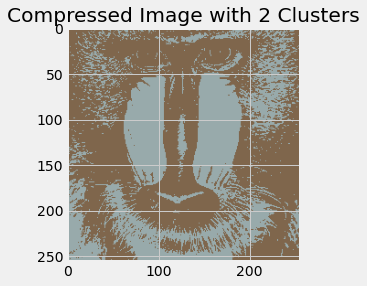

Size of the image with 2 clusters: 16693 bytes
K = 2: WCSS = 299208926.48057, BCSS = 3013703.2071162816, Explained Variance = 0.009971798638078858



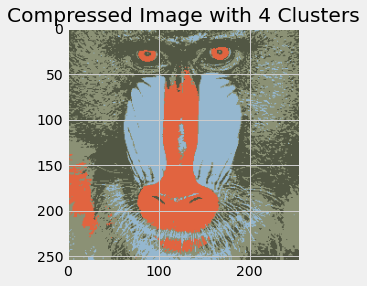

Size of the image with 4 clusters: 17957 bytes
K = 4: WCSS = 120208750.9393356, BCSS = 12203684.494033812, Explained Variance = 0.09216418725395897



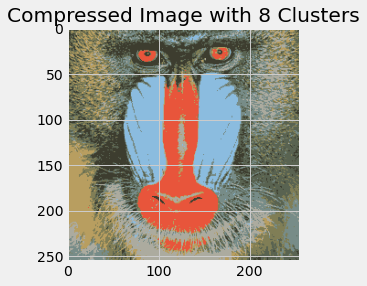

Size of the image with 8 clusters: 18682 bytes
K = 8: WCSS = 61592357.893841565, BCSS = 18948778.49391099, Explained Variance = 0.23526832800924355



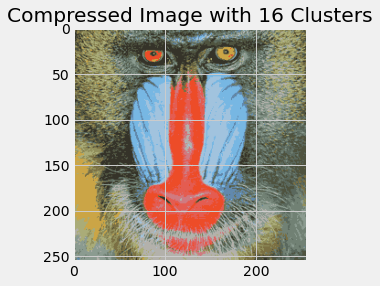

Size of the image with 16 clusters: 19022 bytes
K = 16: WCSS = 33218534.00690241, BCSS = 48117513.156283446, Explained Variance = 0.5915890289055291



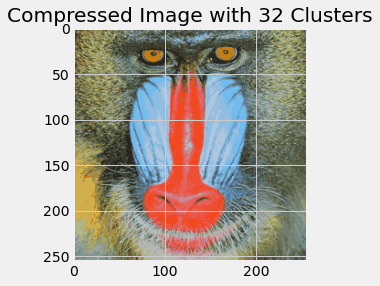

Size of the image with 32 clusters: 18898 bytes
K = 32: WCSS = 18829038.549306888, BCSS = 84077796.27596536, Explained Variance = 0.8170282996141401



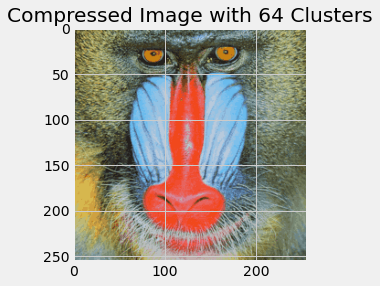

Size of the image with 64 clusters: 18788 bytes
K = 64: WCSS = 11373754.301001072, BCSS = 127022832.57088064, Explained Variance = 0.9178176676312824



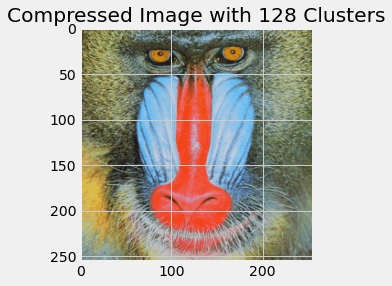

Size of the image with 128 clusters: 18777 bytes
K = 128: WCSS = 7218805.5975813195, BCSS = 247781734.21722734, Explained Variance = 0.9716910183687301



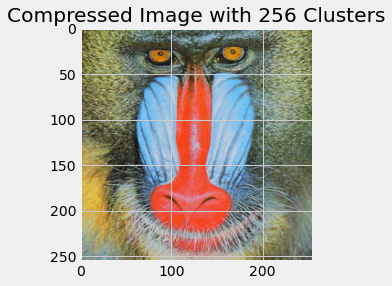

Size of the image with 256 clusters: 18809 bytes
K = 256: WCSS = 4591663.890222198, BCSS = 476586073.64453334, Explained Variance = 0.9904574473587516



In [81]:
# To create loop to perform KMeans cluster for each K value 
for K_ba in K_values:
    # To initialize the KMeans model
    model_baboon = KMeans(n_clusters=K_ba)
    # To fit the model
    model_baboon.fit(img_baboon_reshaped)
    # To assign each pixel to the nearest cluster center
    clustered_img_baboon = model_baboon.cluster_centers_[model_baboon.labels_]
    # To reshape the clustered image to its original shap
    clustered_baboon = clustered_img_baboon.reshape(N, M, 3).astype(np.uint8)
    
    # Save the clustered image as a JPEG file
    clustered_image_filename_ba = f'lenna_clustered_{K_ba}.JPEG'
    Image.fromarray(clustered_baboon).save(clustered_image_filename_ba)
      
    # To retrieve model attributes
    cluster_centers_ba = model_baboon.cluster_centers_ 
    labels_ba = model_baboon.labels_

    # To calculate the total size of the compressed image
    total_size_ba = os.path.getsize(clustered_image_filename_ba)
       
    # To calculate metrics
    WCSS_ba = WCSS_Score(cluster_centers_ba, labels_ba, img_baboon_reshaped)
    BCSS_ba = BCSS_Score(cluster_centers_ba, labels_b, img_baboon_reshaped)
    Explained_Variance_ba = explained_variance_score(WCSS_ba, BCSS_ba)
    
    # To append results to lists
    num_clusters_ba.append(K_ba)
    color_names_ba.append(get_color_names(cluster_centers_ba))  
    WCSS_scores_ba.append(WCSS_ba)
    BCSS_scores_ba.append(BCSS_ba)
    explained_variance_ba.append(Explained_Variance_ba)
    compressed_sizes_ba.append(total_size_ba)
    sse_ba.append(model_baboon.inertia_)
    
    # To plot and display each clustered image
    plt.imshow(clustered_baboon)
    plt.title(f"Compressed Image with {K_ba} Clusters")
    plt.show()
    
    # To print the size and metrics
    print(f"Size of the image with {K_ba} clusters: {total_size_ba} bytes")
    print(f"K = {K_ba}: WCSS = {WCSS_ba}, BCSS = {BCSS_ba}, Explained Variance = {Explained_Variance_ba}\n")

In [82]:
# To create a DataFrame to summarize the results
results_df = pd.DataFrame({
    'Image Name': 'Baboon',
    'Number of Clusters' : num_clusters_ba,
    'WCSS': WCSS_scores_ba,
    'BCSS': BCSS_scores_ba,
    'Explained Variance': explained_variance_ba,
    'Compressed Image Size': compressed_sizes_ba,
    'Color Names': color_names_ba
})

print(results_df)

  Image Name  Number of Clusters          WCSS          BCSS  \
0     Baboon                   2  2.992089e+08  3.013703e+06   
1     Baboon                   4  1.202088e+08  1.220368e+07   
2     Baboon                   8  6.159236e+07  1.894878e+07   
3     Baboon                  16  3.321853e+07  4.811751e+07   
4     Baboon                  32  1.882904e+07  8.407780e+07   
5     Baboon                  64  1.137375e+07  1.270228e+08   
6     Baboon                 128  7.218806e+06  2.477817e+08   
7     Baboon                 256  4.591664e+06  4.765861e+08   

   Explained Variance  Compressed Image Size  \
0            0.009972                  16693   
1            0.092164                  17957   
2            0.235268                  18682   
3            0.591589                  19022   
4            0.817028                  18898   
5            0.917818                  18788   
6            0.971691                  18777   
7            0.990457                  

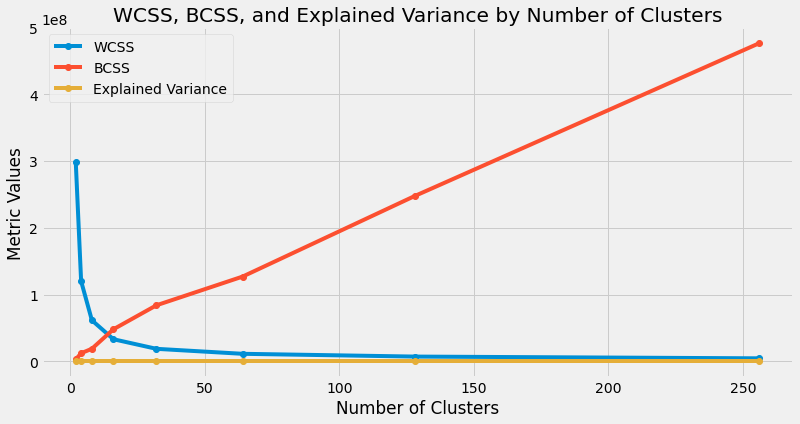

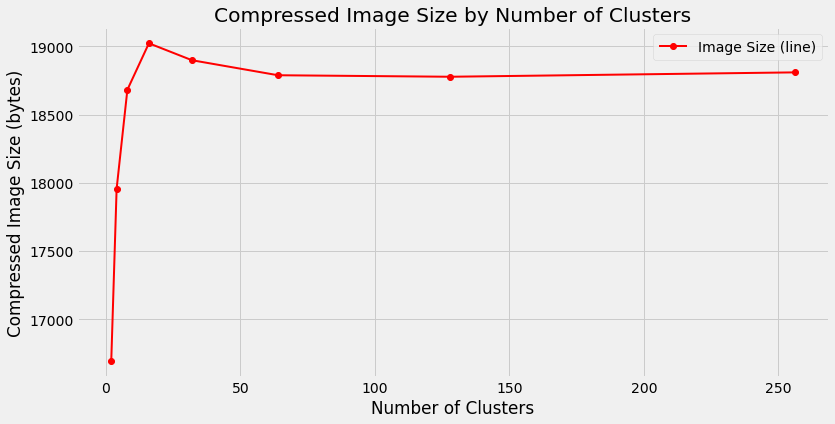

In [83]:
# Line Graphs for WCSS, BCSS, and Explained Variance
plt.figure(figsize=(12, 6))
plt.plot(results_df['Number of Clusters'], results_df['WCSS'], marker='o', label='WCSS')
plt.plot(results_df['Number of Clusters'], results_df['BCSS'], marker='o', label='BCSS')
plt.plot(results_df['Number of Clusters'], results_df['Explained Variance'], marker='o', label='Explained Variance')
plt.xlabel('Number of Clusters')
plt.ylabel('Metric Values')
plt.title('WCSS, BCSS, and Explained Variance by Number of Clusters')
plt.legend()
plt.show()


plt.figure(figsize=(12, 6))
plt.plot(results_df['Number of Clusters'], results_df['Compressed Image Size'], color='red', marker='o', linestyle='-', linewidth=2, label='Image Size (line)')
plt.xlabel('Number of Clusters')
plt.ylabel('Compressed Image Size (bytes)')
plt.title('Compressed Image Size by Number of Clusters')
plt.legend()
plt.show()

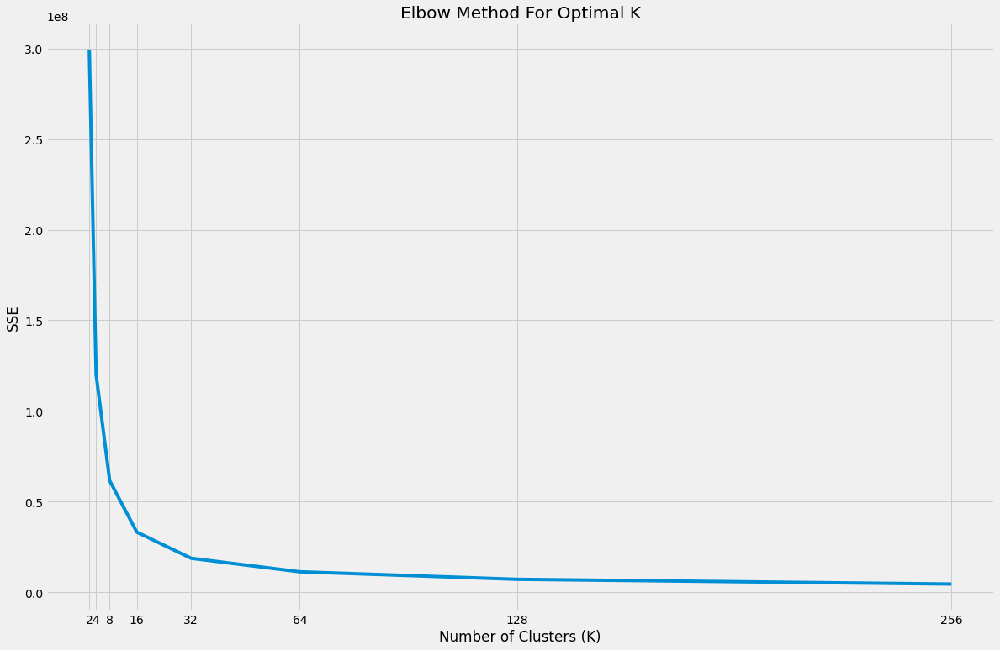

In [84]:
# To create a plot for the Elbow Method
plt.style.use("fivethirtyeight")
plt.figure(figsize=(18, 12))
plt.plot(num_clusters_ba, sse_ba) 
plt.xticks(num_clusters_ba) 
plt.xlabel("Number of Clusters (K)")
plt.ylabel("SSE")
plt.title("Elbow Method For Optimal K")
plt.show()

In [85]:
# To determine the best number of clusters
K_optimal_ba = 32 

# To compare the original and best compressed image 
best_compressed_metrics_ba = results_df[results_df['Number of Clusters'] == K_optimal_ba].iloc[0]
best_compressed_size_ba = best_compressed_metrics_ba['Compressed Image Size']
best_compressed_explained_variance_ba = best_compressed_metrics_ba['Explained Variance']
  
original_explained_variance = 1.0  

print(f"Original Image Size: {original_image_size_ba} bytes")
print(f"Best Compressed Image Size: {best_compressed_size_ba} bytes")

print(f"Original Image Explained Variance: {original_explained_variance}")
print(f"Best Compressed Image Explained Variance: {best_compressed_explained_variance_ba}")

Original Image Size: 179841 bytes
Best Compressed Image Size: 18898 bytes
Original Image Explained Variance: 1.0
Best Compressed Image Explained Variance: 0.8170282996141401


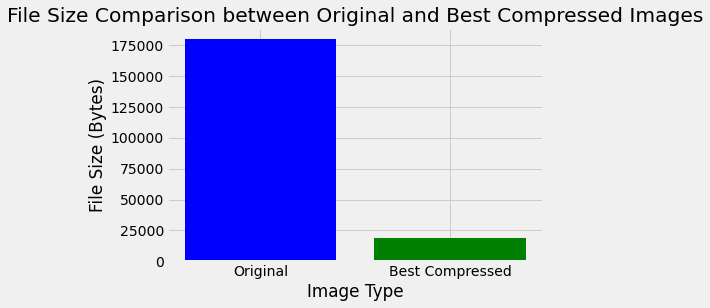

In [86]:
# To compare the original image and best compressed image according to size
categories_sizes = ['Original', 'Best Compressed']
sizes = [original_image_size_ba, best_compressed_size_ba]

plt.figure(figsize=(6, 4))
plt.bar(categories_sizes, sizes, color=['blue', 'green'])
plt.xlabel('Image Type')
plt.ylabel('File Size (Bytes)')
plt.title('File Size Comparison between Original and Best Compressed Images')
plt.show()

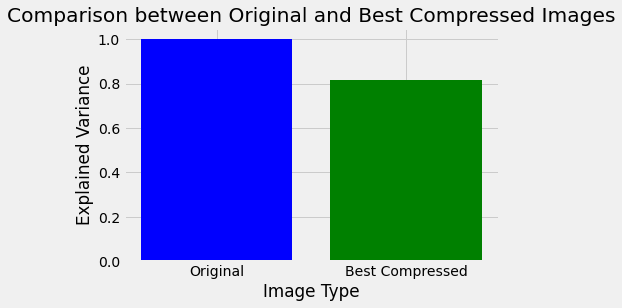

In [87]:
# To compare the original image and best compressed image according to explainded variance
categories_sizes = ['Original', 'Best Compressed']
sizes = [original_explained_variance, best_compressed_explained_variance_ba]

plt.figure(figsize=(6, 4))
plt.bar(categories_sizes, sizes, color=['blue', 'green'])
plt.xlabel('Image Type')
plt.ylabel('Explained Variance')
plt.title('Comparison between Original and Best Compressed Images')
plt.show()

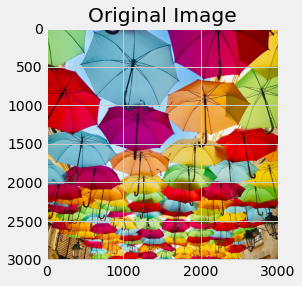

In [88]:
# To load and display the original image
image_5 = "umbrealla.JPEG"
image_umbrealla = Image.open(image_5)
plt.imshow(image_umbrealla)
plt.title("Original Image")
plt.show()

In [89]:
# To calculate the size of the image data
original_image_size_u = os.path.getsize('umbrealla.JPEG') 
print(f"Image Size: {original_image_size_u} bytes")

Image Size: 1622089 bytes


In [90]:
# To calculate the number of unique colors in the image
img_umbrealla_original_array = np.array(image_umbrealla)
num_unique_color_umbrealla_original = np.unique(img_umbrealla_original_array.reshape(-1, 3), axis=0).shape[0]
print(f"Unique colors of the original image: {num_unique_color_umbrealla_original}")

Unique colors of the original image: 905205


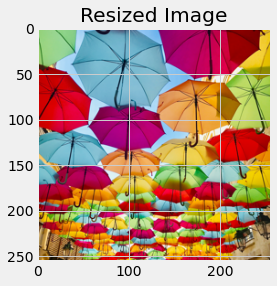

In [91]:
# To resize and display the image
img_umbrealla_resized = image_umbrealla.resize((256, 256))
plt.imshow(img_umbrealla_resized)
plt.title("Resized Image")
plt.show()

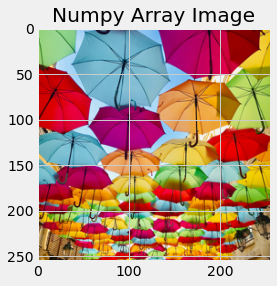

In [92]:
# To convert the image to numpy array and display the image
img_umbrealla_array = np.array(img_umbrealla_resized)
N, M, _ = img_umbrealla_array.shape
plt.imshow(img_umbrealla_array)
plt.title("Numpy Array Image")
plt.show()

In [93]:
# To reshape the data
img_umbrealla_reshaped = img_umbrealla_array.reshape(-1, 3)

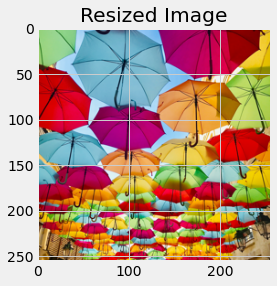

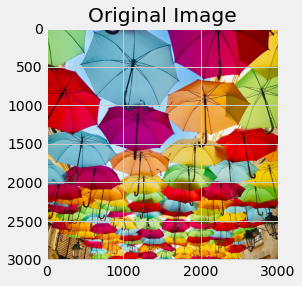

In [94]:
# To compare the resized image and original image
plt.imshow(img_umbrealla_resized)
plt.title("Resized Image")
plt.show()
plt.imshow(image_umbrealla)
plt.title("Original Image")
plt.show()

In [95]:
# To calculate the size of the compressed image data
img_umbrealla_resized.save('umbrealla_resized.JPEG')
img_umbrealla_compressed_size = os.path.getsize('umbrealla_resized.JPEG') 
print(f"Compressed Image Size: {img_umbrealla_compressed_size} bytes")

Compressed Image Size: 20142 bytes


In [96]:
# To calculate the number of unique colors in the image
num_unique_color_umbrealla = np.unique(img_umbrealla_array.reshape(-1, 3), axis=0).shape[0]
print(f"Unique colors of compressed image: {num_unique_color_umbrealla}")

Unique colors of compressed image: 49196


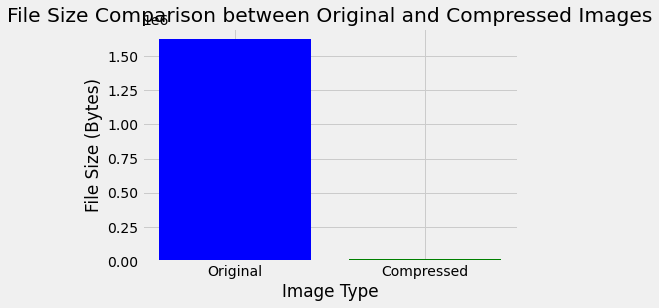

In [97]:
# To compare the original image and compressed image according to size
categories_sizes = ['Original', 'Compressed']
sizes = [original_image_size_u, img_umbrealla_compressed_size]

plt.figure(figsize=(6, 4))
plt.bar(categories_sizes, sizes, color=['blue', 'green'])
plt.xlabel('Image Type')
plt.ylabel('File Size (Bytes)')
plt.title('File Size Comparison between Original and Compressed Images')
plt.show()

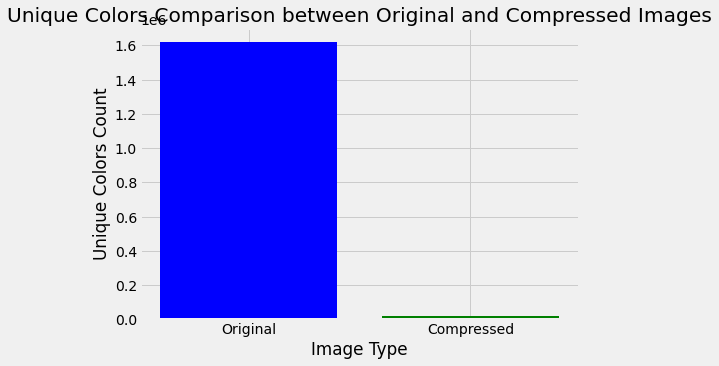

In [98]:
# To compare the original image and compressed image according to number of unique colors 
categories = ['Original', 'Compressed']
color_counts = [num_unique_color_umbrealla_original, num_unique_color_umbrealla]

plt.figure(figsize=(7, 5))
plt.bar(categories_sizes, sizes, color=['blue', 'green'])
plt.xlabel('Image Type')
plt.ylabel('Unique Colors Count')
plt.title('Unique Colors Comparison between Original and Compressed Images')
plt.show()

In [99]:
# To store numbers of clusters and various metrics for different numbers of clusters
num_clusters_u = []
color_names_u = []  
WCSS_scores_u = []
BCSS_scores_u = []
explained_variance_u = []
compressed_sizes_u = []
sse_u=[]

In [100]:
# To set the range of K values for numbers of clusters
K_values = [2**i for i in range(1,9)]

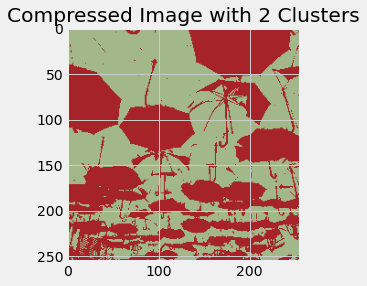

Size of the image with 2 clusters: 16792 bytes
K = 2: WCSS = 504166030.83490527, BCSS = 514548087.88961244, Explained Variance = 0.5050956675989265



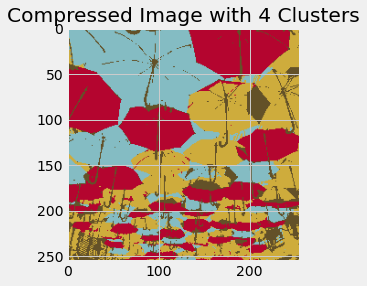

Size of the image with 4 clusters: 19379 bytes
K = 4: WCSS = 239278448.4596017, BCSS = 779488795.6079832, Explained Variance = 0.7651294249467172



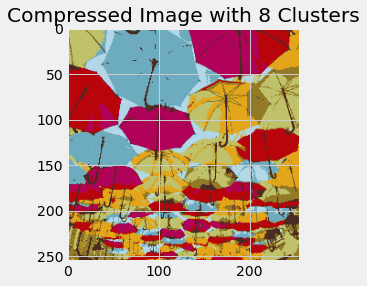

Size of the image with 8 clusters: 20084 bytes
K = 8: WCSS = 128850275.26464887, BCSS = 890044169.9095939, Explained Variance = 0.873539132659994



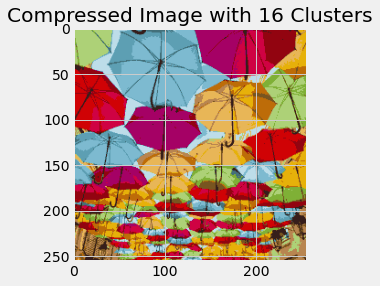

Size of the image with 16 clusters: 21215 bytes
K = 16: WCSS = 65523005.19079625, BCSS = 953321779.973612, Explained Variance = 0.9356889232345406



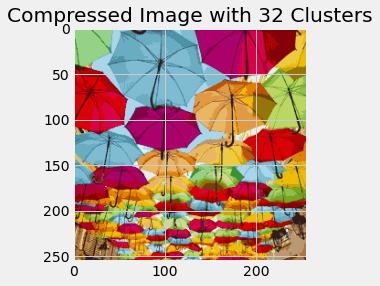

Size of the image with 32 clusters: 21030 bytes
K = 32: WCSS = 36310555.134161055, BCSS = 982601000.2007707, Explained Variance = 0.9643633886140144



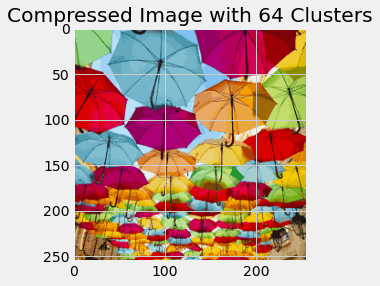

Size of the image with 64 clusters: 20808 bytes
K = 64: WCSS = 19790901.552617982, BCSS = 999079572.1308444, Explained Variance = 0.9805756452230192



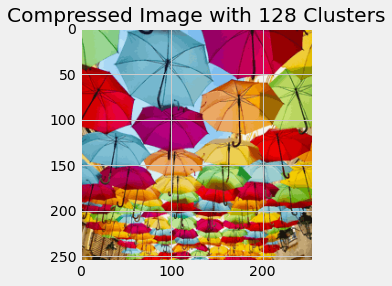

Size of the image with 128 clusters: 20504 bytes
K = 128: WCSS = 11346146.199400648, BCSS = 1007551218.6041034, Explained Variance = 0.9888642893864106



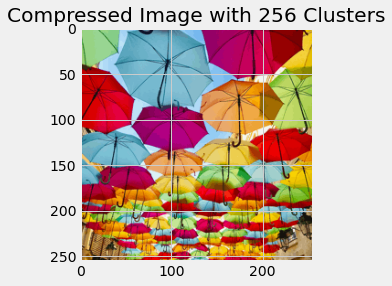

Size of the image with 256 clusters: 20361 bytes
K = 256: WCSS = 6563443.167323708, BCSS = 1012334071.2881372, Explained Variance = 0.9935582891564599



In [101]:
# To create loop to perform KMeans cluster for each K value 
for K_u in K_values:
    # To initialize the KMeans model
    model_umbrealla = KMeans(n_clusters=K_u)
    # To fit the model
    model_umbrealla.fit(img_umbrealla_reshaped)
    # To assign each pixel to the nearest cluster center
    clustered_img_umbrealla = model_umbrealla.cluster_centers_[model_umbrealla.labels_]
    # To reshape the clustered image to its original shap
    clustered_umbrealla = clustered_img_umbrealla.reshape(N, M, 3).astype(np.uint8)
    
    # Save the clustered image as a JPEG file
    clustered_image_filename_u = f'umbrealla_clustered_{K_u}.JPEG'
    Image.fromarray(clustered_umbrealla).save(clustered_image_filename_u)
    
    # To retrieve model attributes
    cluster_centers_u = model_umbrealla.cluster_centers_
    labels_u = model_umbrealla.labels_ 
    
    # To calculate the total size of the compressed image
    total_size_u = os.path.getsize(clustered_image_filename_u)
       
    # To calculate metrics
    WCSS_u = WCSS_Score(cluster_centers_u, labels_u, img_umbrealla_reshaped)
    BCSS_u = BCSS_Score(cluster_centers_u, labels_u, img_umbrealla_reshaped)
    Explained_Variance_u = explained_variance_score(WCSS_u, BCSS_u)
    
    # To append results to lists
    num_clusters_u.append(K_u)
    color_names_u.append(get_color_names(cluster_centers_u))  
    WCSS_scores_u.append(WCSS_u)
    BCSS_scores_u.append(BCSS_u)
    explained_variance_u.append(Explained_Variance_u)
    compressed_sizes_u.append(total_size_u)
    sse_u.append(model_umbrealla.inertia_)
    
    # To plot and display each clustered image
    plt.imshow(clustered_umbrealla)
    plt.title(f"Compressed Image with {K_u} Clusters")
    plt.show()
    
    # To print the size and metrics
    print(f"Size of the image with {K_u} clusters: {total_size_u} bytes")
    print(f"K = {K_u}: WCSS = {WCSS_u}, BCSS = {BCSS_u}, Explained Variance = {Explained_Variance_u}\n")

In [102]:
# To create a DataFrame to summarize the results
results_df = pd.DataFrame({
    'Image Name': 'Umbrealla',
    'Number of Clusters' : num_clusters_u,
    'WCSS': WCSS_scores_u,
    'BCSS': BCSS_scores_u,
    'Explained Variance': explained_variance_u,
    'Compressed Image Size': compressed_sizes_u,
    'Color Names': color_names_u
})

print(results_df)

  Image Name  Number of Clusters          WCSS          BCSS  \
0  Umbrealla                   2  5.041660e+08  5.145481e+08   
1  Umbrealla                   4  2.392784e+08  7.794888e+08   
2  Umbrealla                   8  1.288503e+08  8.900442e+08   
3  Umbrealla                  16  6.552301e+07  9.533218e+08   
4  Umbrealla                  32  3.631056e+07  9.826010e+08   
5  Umbrealla                  64  1.979090e+07  9.990796e+08   
6  Umbrealla                 128  1.134615e+07  1.007551e+09   
7  Umbrealla                 256  6.563443e+06  1.012334e+09   

   Explained Variance  Compressed Image Size  \
0            0.505096                  16792   
1            0.765129                  19379   
2            0.873539                  20084   
3            0.935689                  21215   
4            0.964363                  21030   
5            0.980576                  20808   
6            0.988864                  20504   
7            0.993558                  

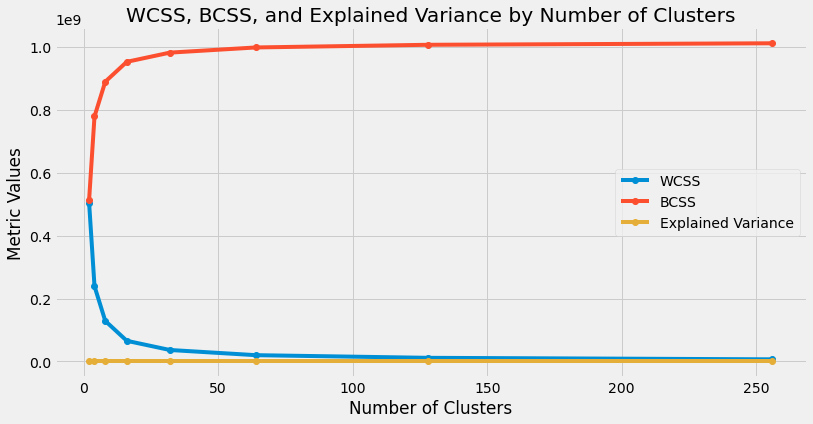

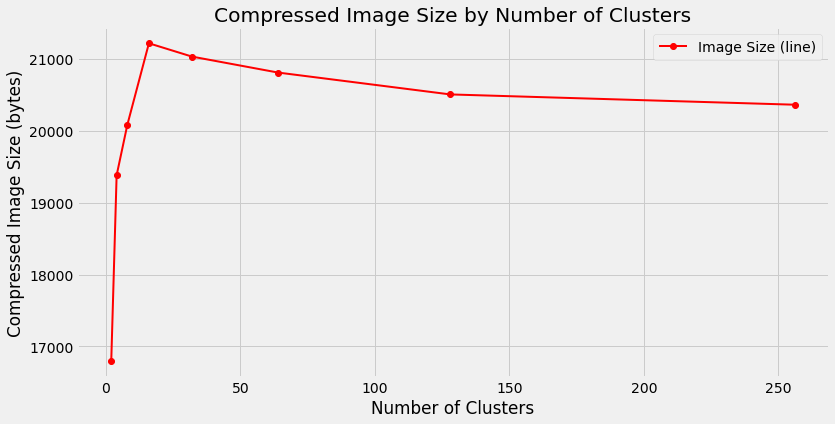

In [103]:
# Line Graphs for WCSS, BCSS, and Explained Variance
plt.figure(figsize=(12, 6))
plt.plot(results_df['Number of Clusters'], results_df['WCSS'], marker='o', label='WCSS')
plt.plot(results_df['Number of Clusters'], results_df['BCSS'], marker='o', label='BCSS')
plt.plot(results_df['Number of Clusters'], results_df['Explained Variance'], marker='o', label='Explained Variance')
plt.xlabel('Number of Clusters')
plt.ylabel('Metric Values')
plt.title('WCSS, BCSS, and Explained Variance by Number of Clusters')
plt.legend()
plt.show()


plt.figure(figsize=(12, 6))
plt.plot(results_df['Number of Clusters'], results_df['Compressed Image Size'], color='red', marker='o', linestyle='-', linewidth=2, label='Image Size (line)')
plt.xlabel('Number of Clusters')
plt.ylabel('Compressed Image Size (bytes)')
plt.title('Compressed Image Size by Number of Clusters')
plt.legend()
plt.show()

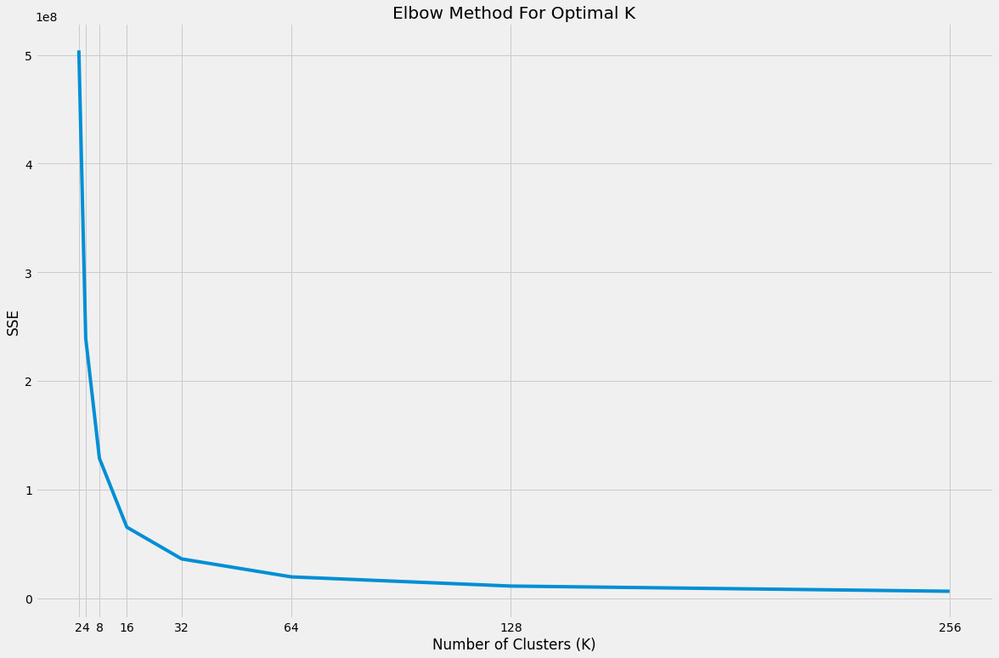

In [104]:
# To create a plot for the Elbow Method
plt.style.use("fivethirtyeight")
plt.figure(figsize=(18, 12))
plt.plot(num_clusters_u, sse_u) 
plt.xticks(num_clusters_u) 
plt.xlabel("Number of Clusters (K)")
plt.ylabel("SSE")
plt.title("Elbow Method For Optimal K")
plt.show()

In [105]:
# To determine the best number of clusters
K_optimal_u = 16  

# To compare the original and best compressed image 
best_compressed_metrics_u = results_df[results_df['Number of Clusters'] == K_optimal_u].iloc[0]
best_compressed_size_u = best_compressed_metrics_u['Compressed Image Size']
best_compressed_explained_variance_u = best_compressed_metrics_u['Explained Variance']

original_explained_variance = 1.0  

print(f"Original Image Size: {original_image_size_u} bytes")
print(f"Best Compressed Image Size: {best_compressed_size_u} bytes")

print(f"Original Image Explained Variance: {original_explained_variance}")
print(f"Best Compressed Image Explained Variance: {best_compressed_explained_variance_u}")

Original Image Size: 1622089 bytes
Best Compressed Image Size: 21215 bytes
Original Image Explained Variance: 1.0
Best Compressed Image Explained Variance: 0.9356889232345406


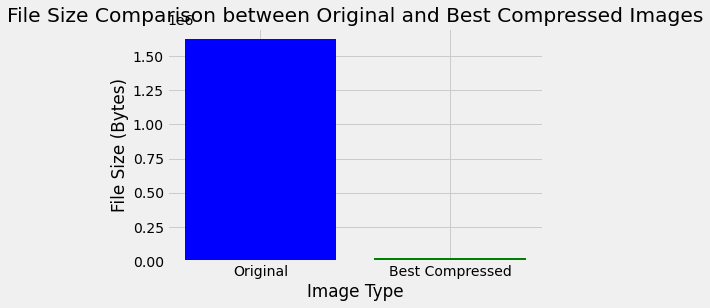

In [106]:
# To compare the original image and best compressed image according to size
categories_sizes = ['Original', 'Best Compressed']
sizes = [original_image_size_u, best_compressed_size_u]

plt.figure(figsize=(6, 4))
plt.bar(categories_sizes, sizes, color=['blue', 'green'])
plt.xlabel('Image Type')
plt.ylabel('File Size (Bytes)')
plt.title('File Size Comparison between Original and Best Compressed Images')
plt.show()

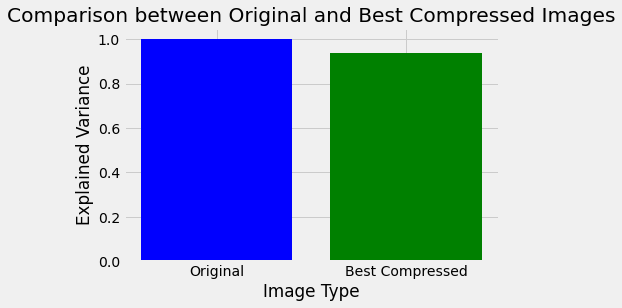

In [107]:
# To compare the original image and best compressed image according to explainded variance
categories_sizes = ['Original', 'Best Compressed']
sizes = [original_explained_variance, best_compressed_explained_variance_u]

plt.figure(figsize=(6, 4))
plt.bar(categories_sizes, sizes, color=['blue', 'green'])
plt.xlabel('Image Type')
plt.ylabel('Explained Variance')
plt.title('Comparison between Original and Best Compressed Images')
plt.show()